
# **2. Classification Task**
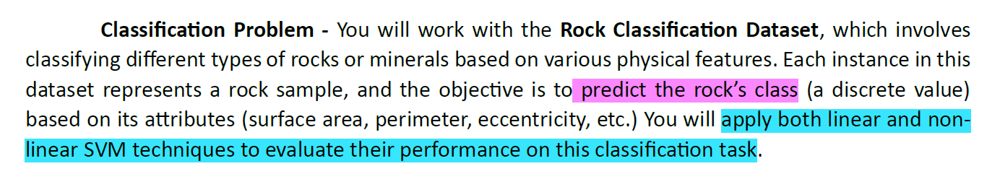


## **2.1 Dataset Overview**

**FEATURES DESCRIPTION:**


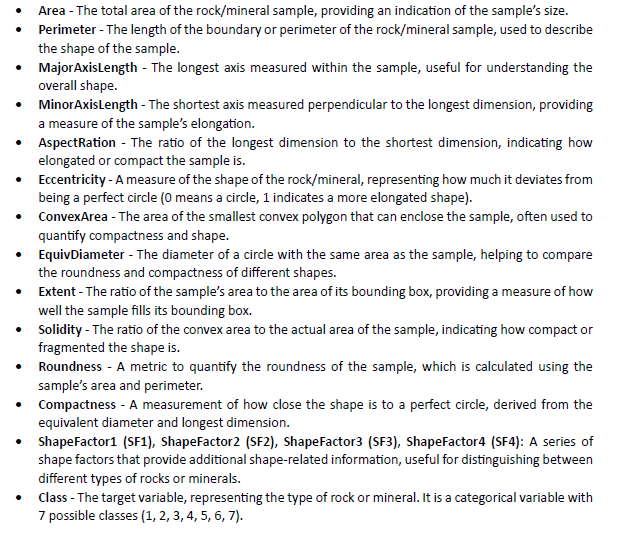

**GOAL: classify the type of rock or mineral based on its measurable characteristics.**

### Importing the essential libraries

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix
from matplotlib.colors import ListedColormap
import warnings
warnings.filterwarnings("ignore")

# Plot styles to set aesthetic preferences for your visualizations.
sns.set()
plt.style.use('ggplot')

### Importing the dataset

In [ ]:
# mounting drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Assignment 2/rock_classification_dataset.csv')

In [ ]:
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,1
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,1
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,1
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,1
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,7
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,7
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,7
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653247,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,7


### Understanding the data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  int64  
dtypes: float64(1

In [ ]:
for column in df.columns:
  print(f"{column}: {df[column].nunique()}")


Area: 12011
Perimeter: 13351
MajorAxisLength: 13543
MinorAxisLength: 13543
AspectRation: 13543
Eccentricity: 13543
ConvexArea: 12066
EquivDiameter: 12011
Extent: 13535
Solidity: 13522
roundness: 13540
Compactness: 13543
ShapeFactor1: 13521
ShapeFactor2: 13506
ShapeFactor3: 13543
ShapeFactor4: 13532
Class: 7


### Dividing the columns into three categories


1.   **Numerical Data:**
      * Area
      * Perimeter
      * MajorAxisLength
      * MinorAxisLength
      * AspectRation
      * Eccentricity
      * ConvexArea
      * EquivDiameter
      * Extent
      * Solidity
      * roundness
      * Compactness
      * ShapeFactor1
      * ShapeFactor2
      * ShapeFactor3
      * ShapeFactor4

2.   **Categorical Data:**
      * Class

3.   **Mixed Data:**
      * None



## **2.2 Data Exploration and Preprocessing**

### **2.2.1 Exploratory Data Analysis (EDA)**

####**Univariate Analysis**

Univariate analysis focuses on analyzing each feature in the dataset independently.



*   **Distribution analysis:** The distribution of each feature is examined to identify its shape, central tendency, and dispersion
*   **Identifying potential issues:** Univariate analysis helps in identifying potential problems with the data such as outliers, skewness and missing values



##### **Steps of doing Univariate Analysis on Numerical columns**

**Descriptive Statistics:** Compute basic summary statistics for the column, such as mean, median, mode, standard deviation, range, and quartiles. These statistics give a general understanding of the distribution of the data and can help identify skewness or outliers.

**Visualizations:** Create visualizations to explore the distribution of the data. Some common visualizations for numerical data include histograms, box plots, and density plots. These visualizations provide a visual representation of the distribution of the data and can help identify skewness an outliers.

**Data Imbalances**

**Identifying Outliers:** Identify and examine any outliers in the data. Outliers can be identified using visualizations. It is important to determine whether the outliers are due to measurement errors, data entry errors, or legitimate differences in the data, and to decide whether to include or exclude them from the analysis.

**Skewness:** Check for skewness in the data and consider transforming the data or using robust statistical methods that are less sensitive to skewness, if necessary.

**Conclusion:** Summarize the findings of the EDA and make decisions about how to proceed with further analysis.

##### **Numerical Variables**

**Automation Function for Univariate Analysis Of Numerical Features**

In [ ]:
def analyze_feature(df, feature):
    # Statistical summary and skewness
    stats = df[feature].describe()
    skewness = df[feature].skew()
    missing_values = df[feature].isnull().sum()  # Calculate missing values

    # Set up a canvas for plotting
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))

    # Histogram
    axs[0, 0].hist(df[feature].dropna(), bins=20, color='skyblue', edgecolor='black')  # Exclude missing values
    axs[0, 0].set_title(f'Histogram of {feature}')
    axs[0, 0].set_xlabel(feature)
    axs[0, 0].set_ylabel('Frequency')

    # KDE Plot
    sns.kdeplot(df[feature].dropna(), ax=axs[0, 1], color='purple', fill=True)  # Exclude missing values
    axs[0, 1].set_title(f'KDE Plot of {feature}')
    axs[0, 1].set_xlabel(feature)
    axs[0, 1].set_ylabel('Density')

    # Boxplot
    sns.boxplot(x=df[feature], ax=axs[1, 0], color='lightgreen')
    axs[1, 0].set_title(f'Boxplot of {feature}')
    axs[1, 0].set_xlabel(feature)

    # Key Metrics
    axs[1, 1].axis('off')  # Turn off the axis
    textstr = (
        f"### Key Metrics ###\n\n"
        f"{stats.to_string()}\n\n"
        f"Skewness: {skewness:.2f}\n"
        f"Missing Values: {missing_values}"
    )
    axs[1, 1].text(
        0.5, 0.5, textstr, fontsize=12, ha='center', va='center',
        bbox=dict(boxstyle="round", facecolor="lightgrey")
    )

    # Adjust layout
    plt.tight_layout()
    plt.show()


###### **Area**

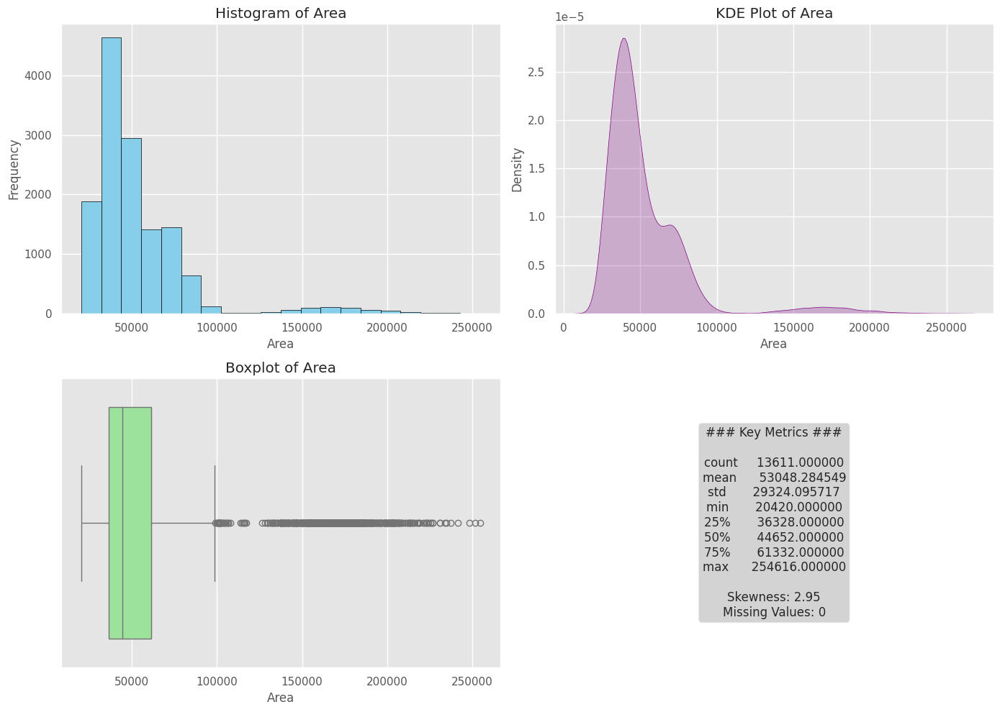

In [ ]:
analyze_feature(df,'Area')

###### **Perimeter**

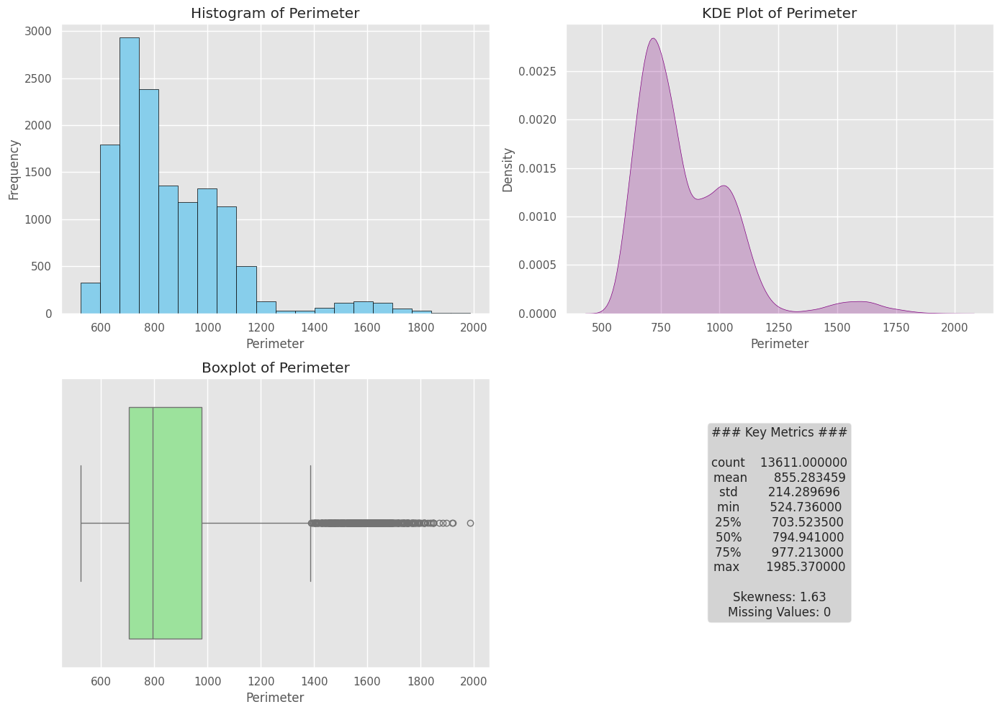

In [ ]:
analyze_feature(df,'Perimeter')

###### **MajorAxisLength**

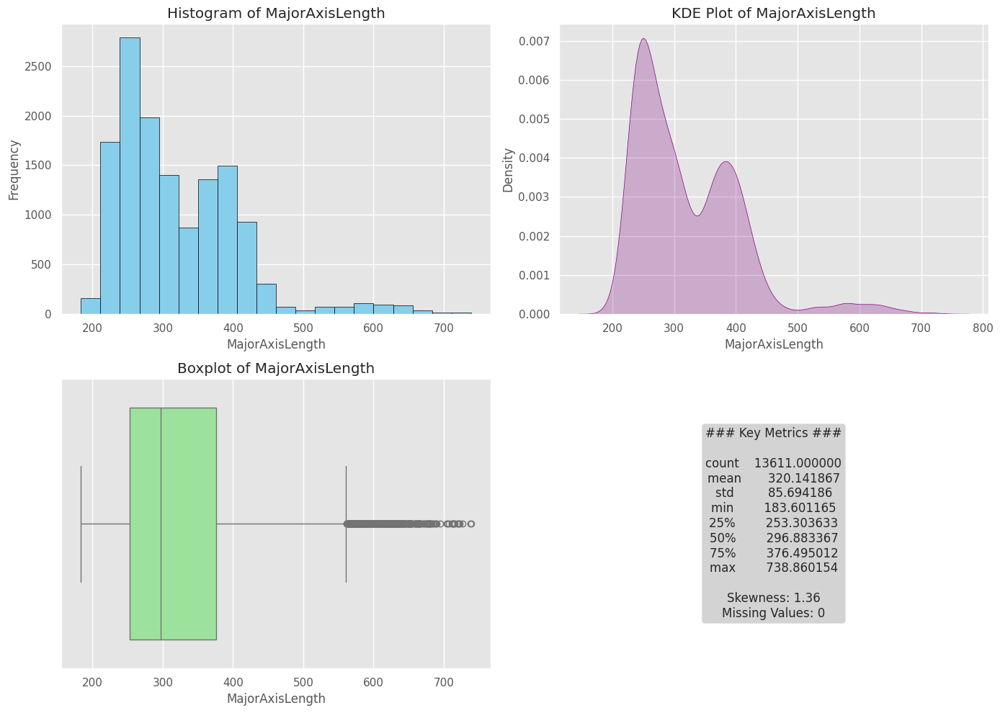

In [ ]:
analyze_feature(df,'MajorAxisLength')

###### **MinorAxisLength**

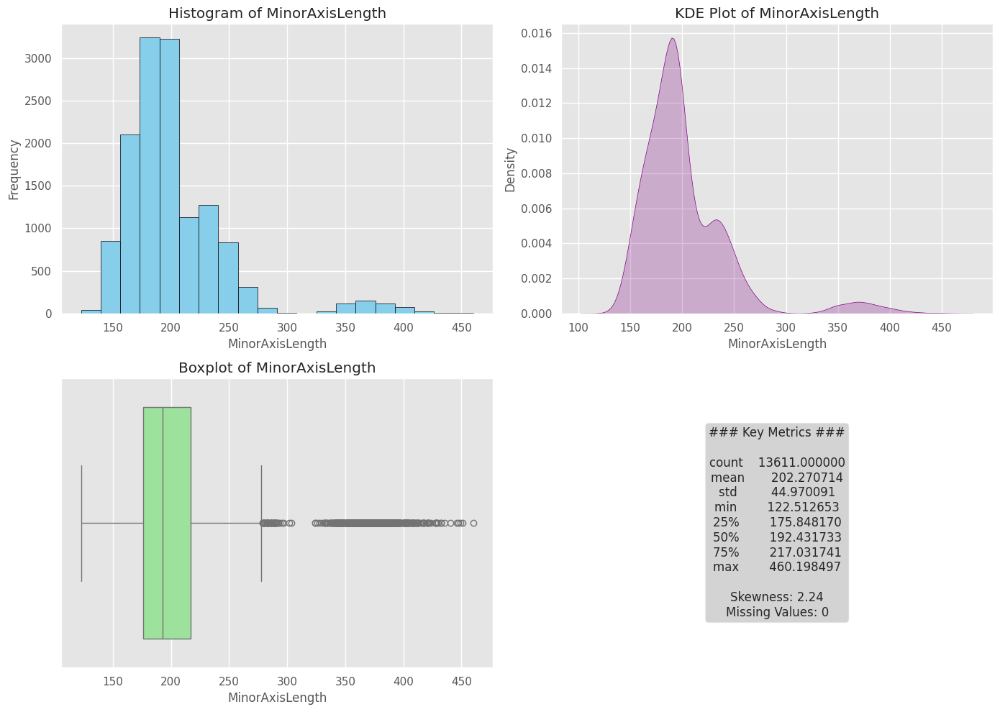

In [ ]:
analyze_feature(df,'MinorAxisLength')

###### **AspectRation**

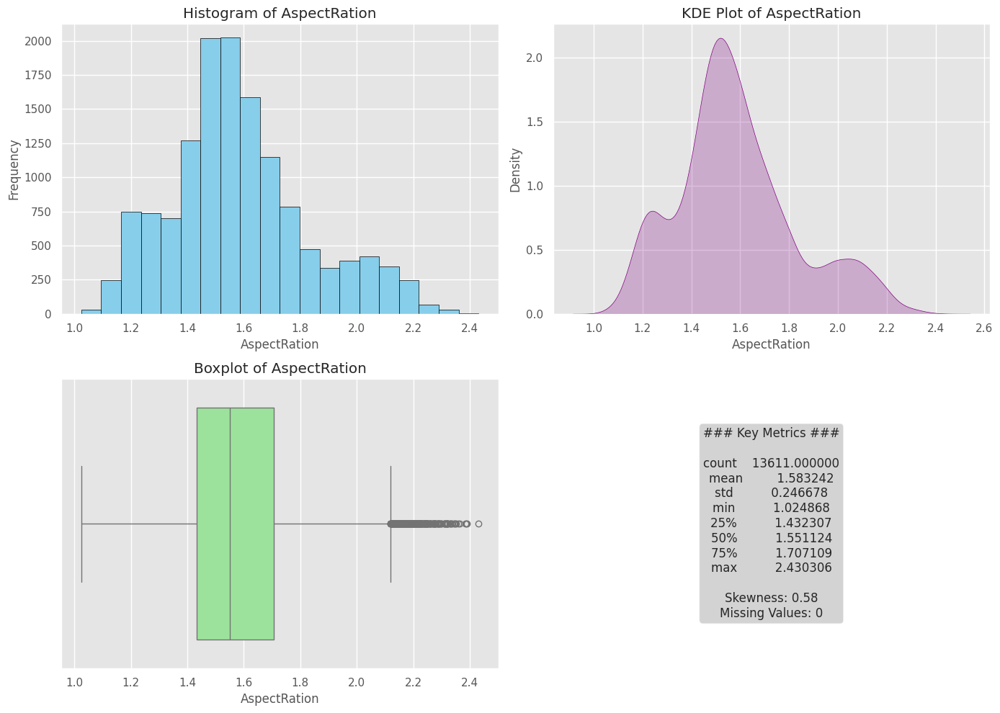

In [ ]:
analyze_feature(df,'AspectRation')

###### **Eccentricity**

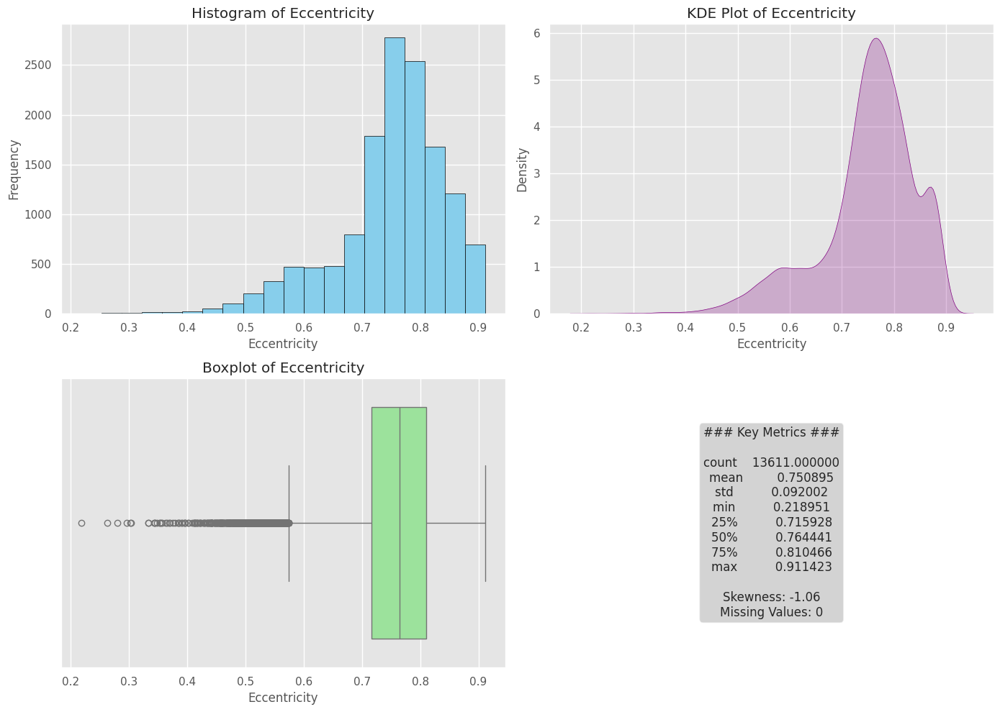

In [ ]:
analyze_feature(df,'Eccentricity')

###### **ConvexArea**

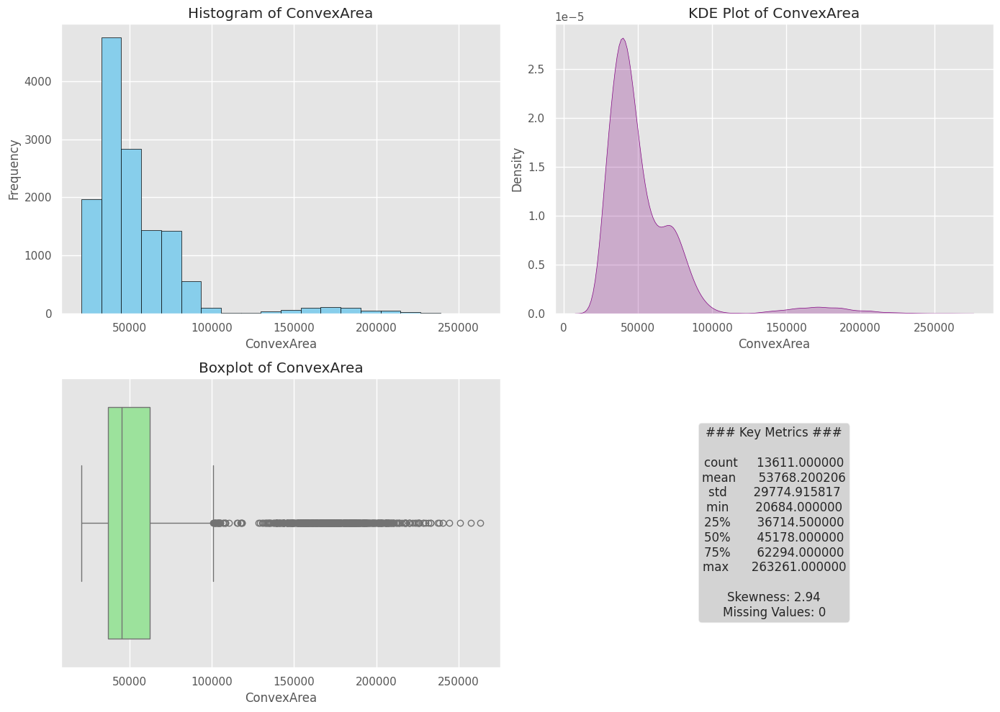

In [ ]:
analyze_feature(df,'ConvexArea')

###### **EquivDiameter**

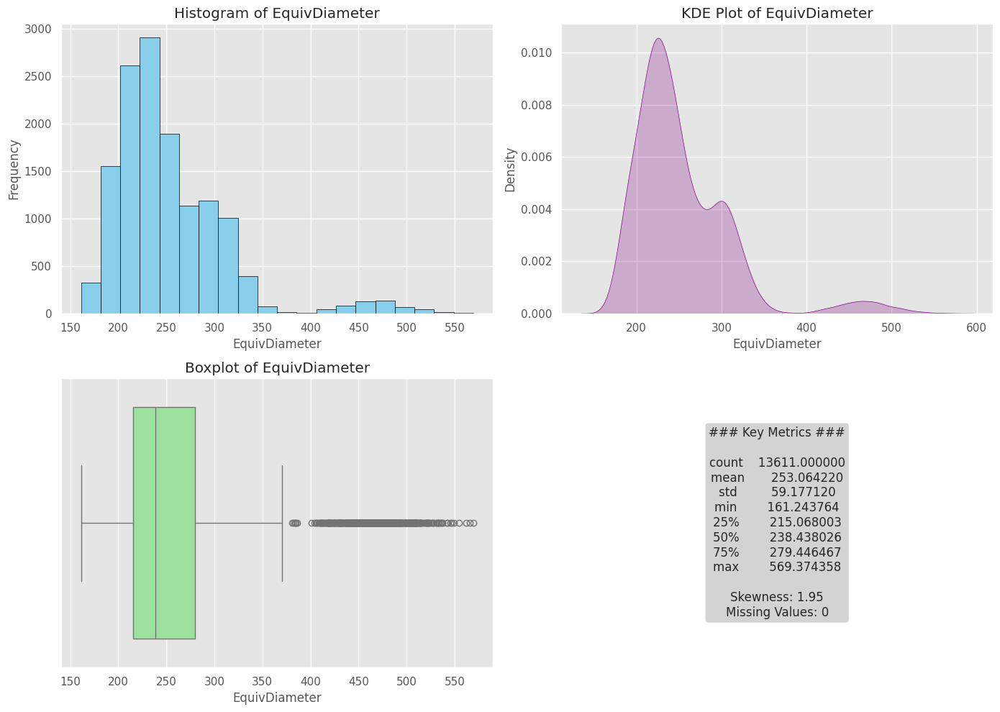

In [ ]:
analyze_feature(df,'EquivDiameter')

###### **Extent**

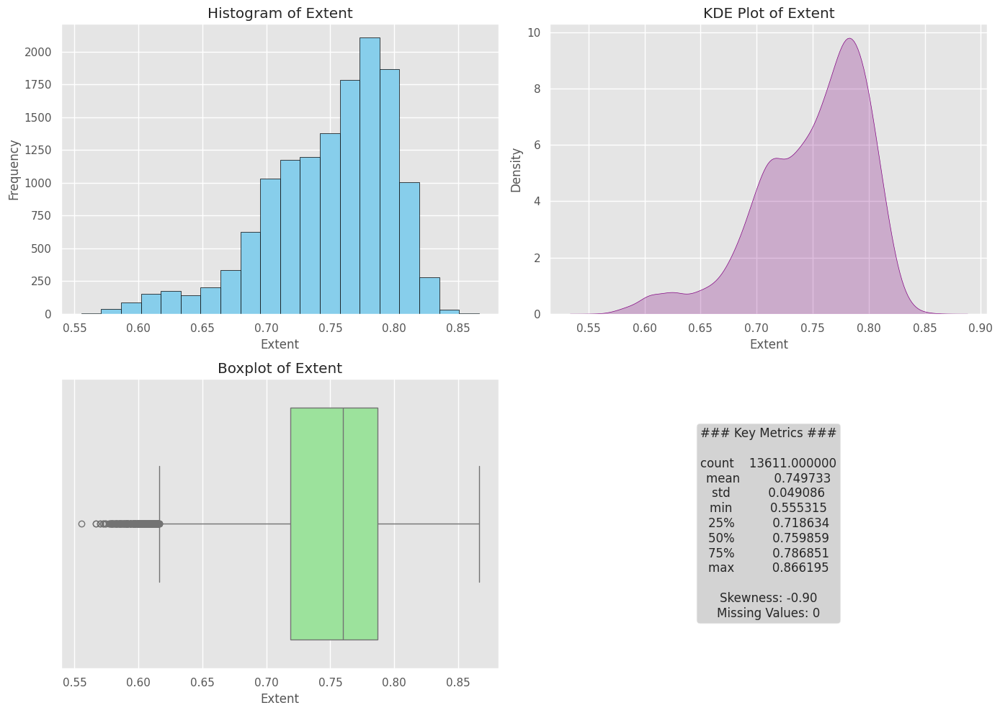

In [ ]:
analyze_feature(df,'Extent')

###### **Solidity**

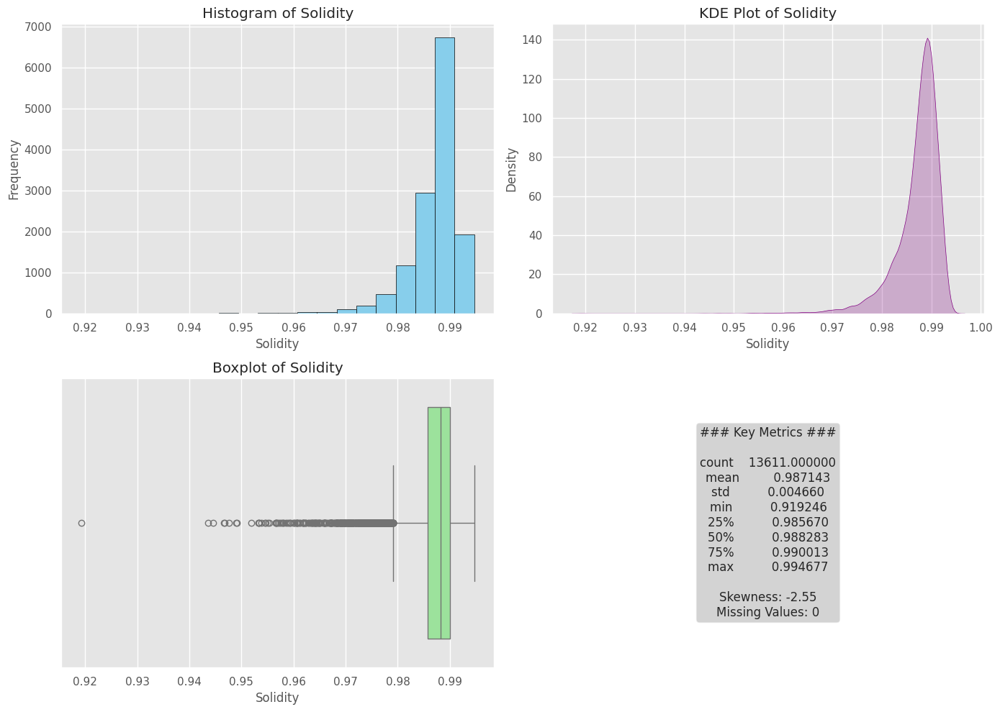

In [ ]:
analyze_feature(df,'Solidity')

###### **roundness**

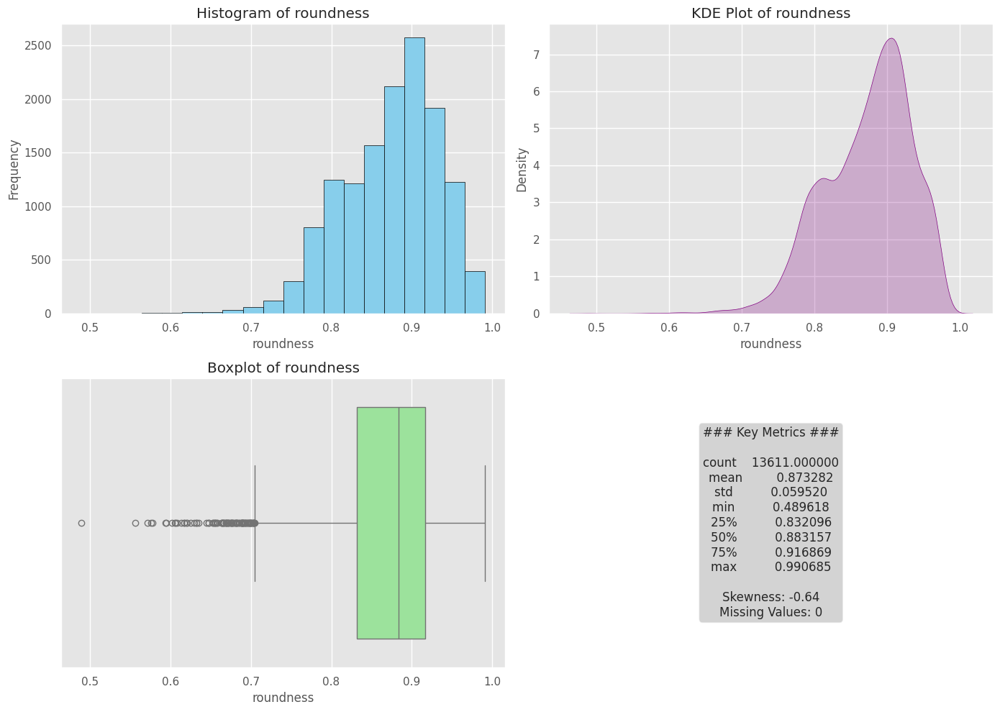

In [ ]:
analyze_feature(df,'roundness')

###### **Compactness**

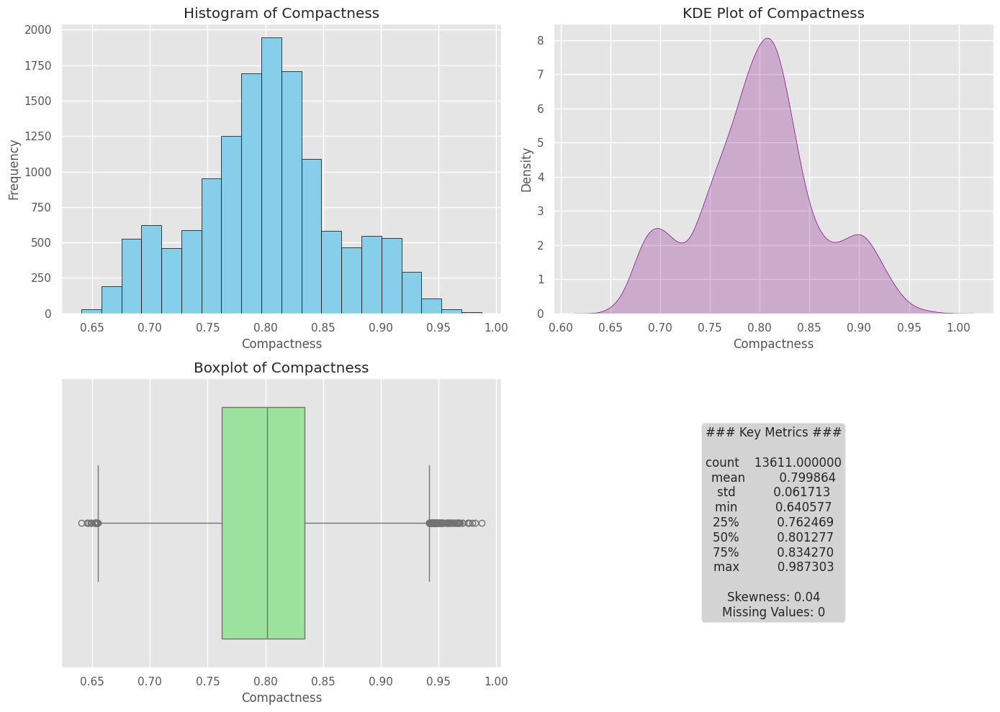

In [ ]:
analyze_feature(df,'Compactness')

###### **ShapeFactor1**

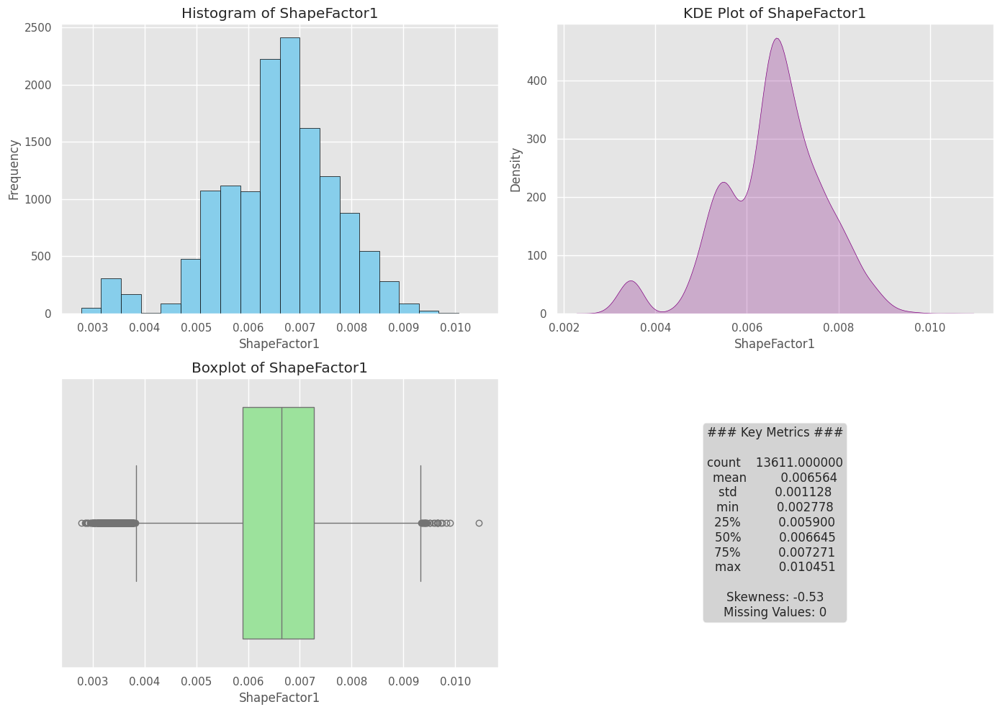

In [ ]:
analyze_feature(df,'ShapeFactor1')

###### **ShapeFactor2**

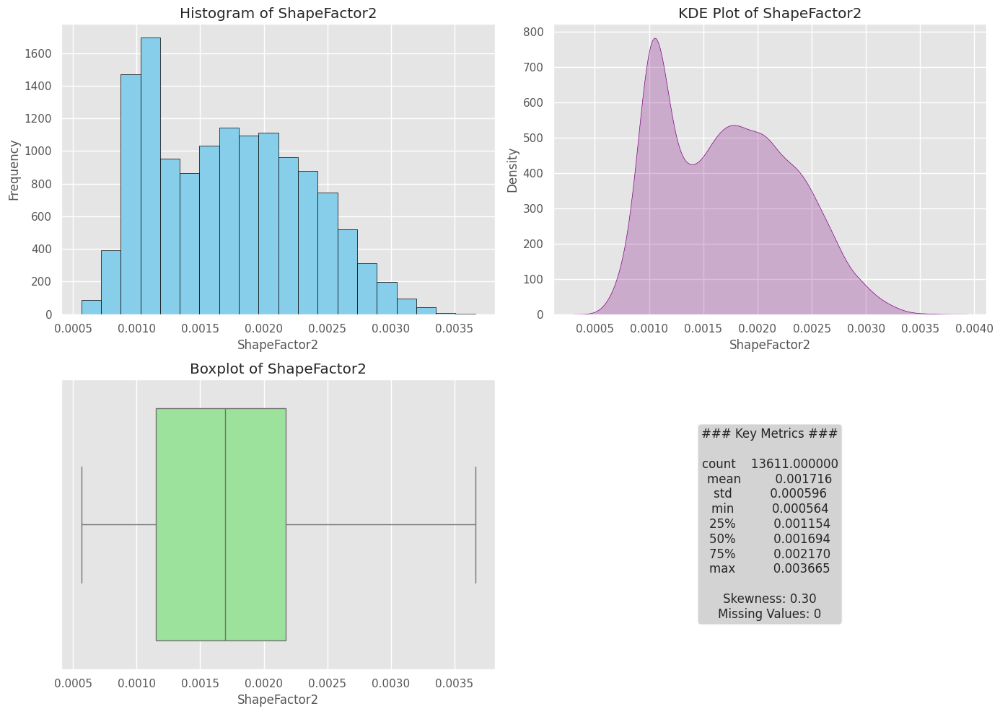

In [ ]:
analyze_feature(df,'ShapeFactor2')

###### **ShapeFactor3**

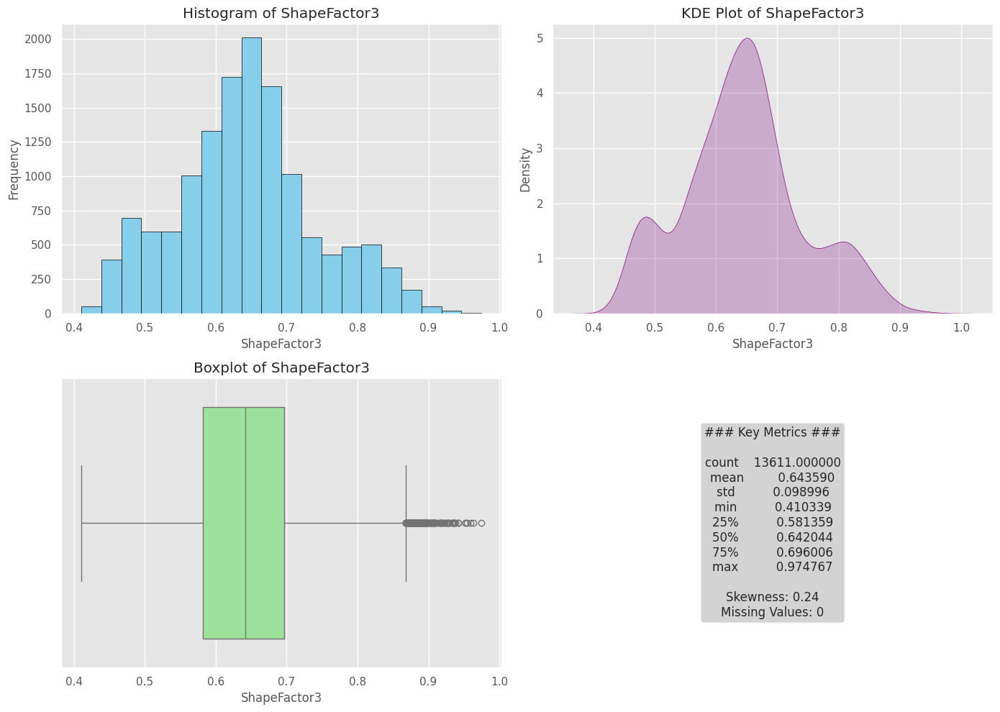

In [ ]:
analyze_feature(df,'ShapeFactor3')

###### **ShapeFactor4**

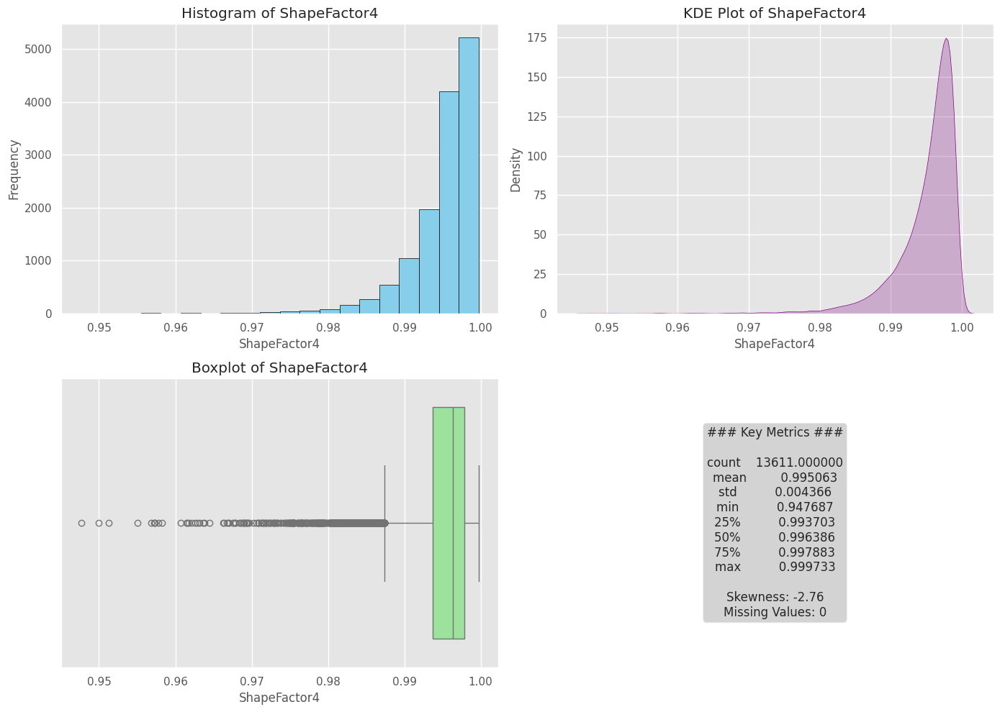

In [ ]:
analyze_feature(df,'ShapeFactor4')

##### **Categorical Variables**

**Automation Function for Univariate Analysis Of Categorical Features**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_categorical_variable(df, column):
    """
    Perform univariate analysis for a categorical variable in a presentable manner.

    Parameters:
        df (pd.DataFrame): The dataframe containing the data.
        column (str): The column name of the categorical variable to analyze.
    """
    # Value counts
    value_counts = df[column].value_counts()
    missing_values = df[column].isnull().sum()

    # Set up subplots for bar and pie charts
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Bar Plot
    value_counts.plot(kind='bar', color='skyblue', ax=axs[0])
    axs[0].set_title(f'Bar Plot of {column}', fontsize=14)
    axs[0].set_xlabel(column, fontsize=12)
    axs[0].set_ylabel('Frequency', fontsize=12)

    # Pie Chart
    value_counts.plot(kind='pie', autopct='%1.1f%%', colors=['red', 'green', 'yellow', 'orange', 'skyblue', 'violet', 'pink'], ax=axs[1])
    axs[1].set_title(f'Pie Chart of {column}', fontsize=14)
    axs[1].set_ylabel('')  # Remove y-label for the pie chart

    # Summary Box
    axs[2].axis('off')  # Turn off the axis
    summary_text = f"### Analysis of '{column}' ###\n\n"
    summary_text += "Value Counts:\n"
    summary_text += "\n".join([f"{index}: {value}" for index, value in value_counts.items()])
    summary_text += f"\n\nMissing Values: {missing_values}"
    axs[2].text(0.5, 0.5, summary_text, fontsize=12, ha='center', va='center',
                bbox=dict(boxstyle="round", facecolor="lightgrey"))

    # Adjust layout
    plt.tight_layout()
    plt.show()


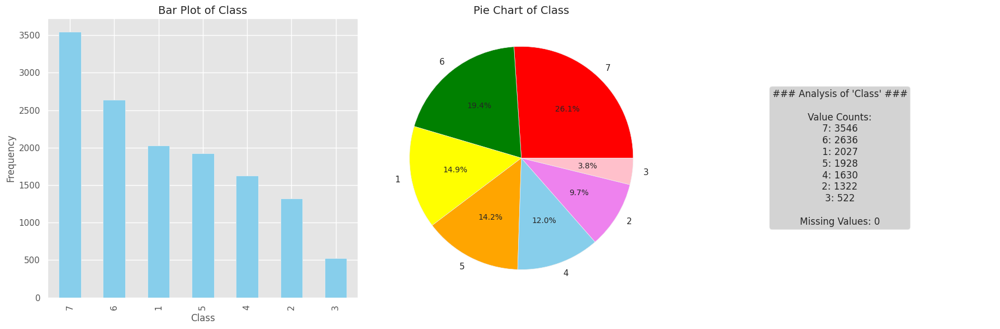

In [ ]:
analyze_categorical_variable(df,'Class')

#### **Bivariate Analysis**


##### **Steps of doing Bivariate Analysis**

- Select 2 cols
- Understand type of relationship
    1. **Numerical - Numerical**<br>
        a. You can plot graphs like scatterplot(regression plots), 2D histplot, 2D KDEplots<br>
        b. Check correlation coefficent to check linear relationship
    2. **Numerical - Categorical** - create visualizations that compare the distribution of the numerical data across different categories of the categorical data.<br>
        a. You can plot graphs like barplot, boxplot, kdeplot violinplot even scatterplots. Scatterplots are not as much beneficial<br>
    3. **Categorical - Categorical**<br>
        a. You can create cross-tabulations or contingency tables that show the distribution of values in one categorical column, grouped by the values in the other categorical column.<br>
        b. You can plots like heatmap, stacked barplots, treemaps


##### **First Type: Numerical-Numerical**

**Function For Bivariate Analysis of Numerical-Numerical Combination Of Features**

In [ ]:

def bivariate_analysis_numerical_numerical(df, feature1, feature2):
    """
    Perform bivariate analysis between two numerical features, displaying only
    the scatter plot and the correlation coefficient, with different colors for each feature.

    Parameters:
        df (pd.DataFrame): The dataframe containing the data.
        feature1 (str): The column name of the first numerical feature.
        feature2 (str): The column name of the second numerical feature.
    """
    # Calculate correlation coefficient
    correlation_coefficient = df[[feature1, feature2]].corr().iloc[0, 1]

    # Set up a canvas for plotting with a smaller figure size
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Define unique colors for the features
    feature1_color = 'skyblue'
    feature2_color = 'orange'

    # Scatter Plot with Regression Line and Different Colors
    sns.regplot(x=feature1, y=feature2, data=df, ax=axs[0], scatter_kws={'alpha': 0.6, 'color': feature1_color}, line_kws={'color': feature2_color})
    axs[0].set_title(f'Scatterplot with Regression: {feature1} vs {feature2}', fontsize=14)
    axs[0].set_xlabel(feature1, fontsize=12)
    axs[0].set_ylabel(feature2, fontsize=12)

    # Display Correlation Coefficient with different color text
    axs[1].axis('off')  # Turn off the axis
    textstr = f"### Correlation Analysis ###\n\nCorrelation Coefficient: {correlation_coefficient:.2f}"
    axs[1].text(0.5, 0.5, textstr, fontsize=14, ha='center', va='center', bbox=dict(boxstyle="round", facecolor="lightgreen"))

    # Adjust layout
    plt.tight_layout()
    plt.show()


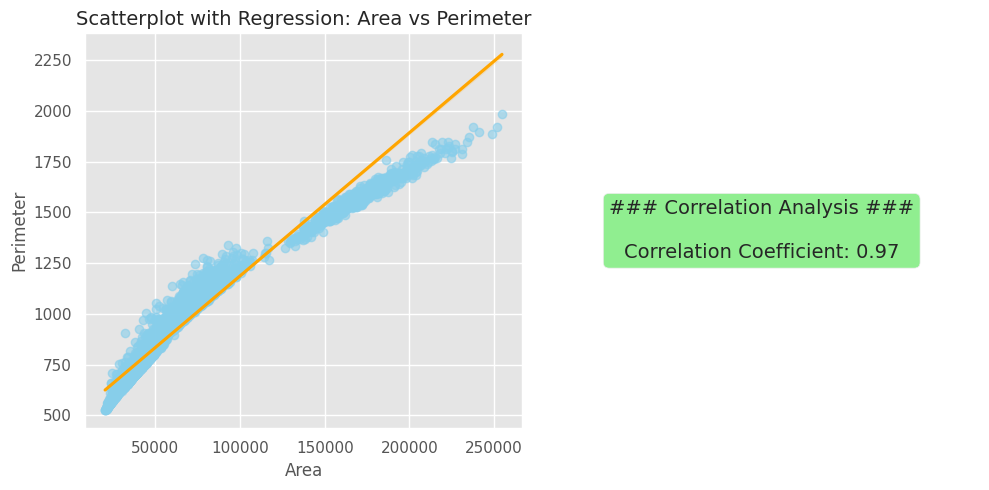

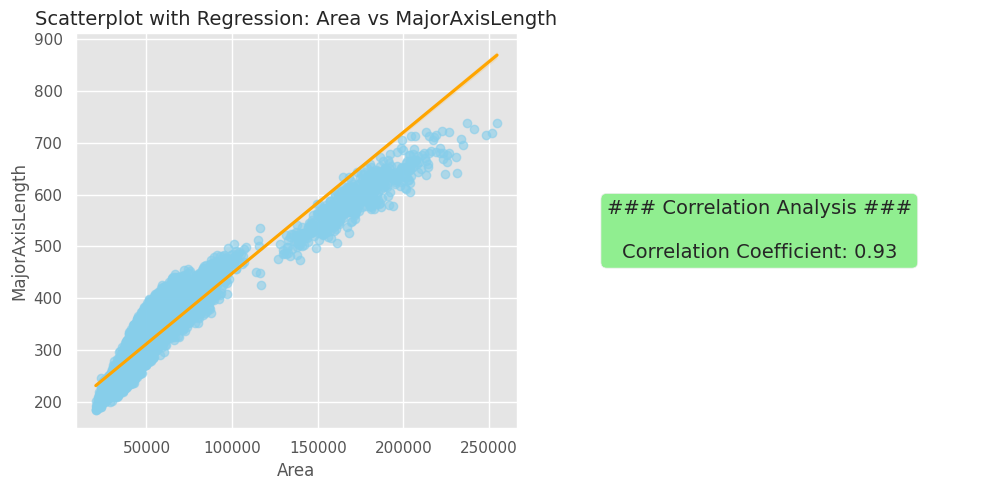

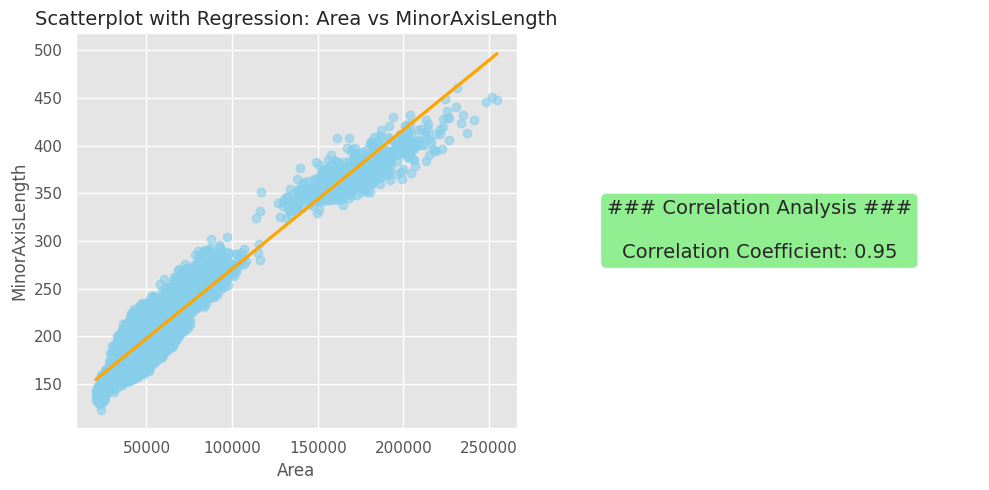

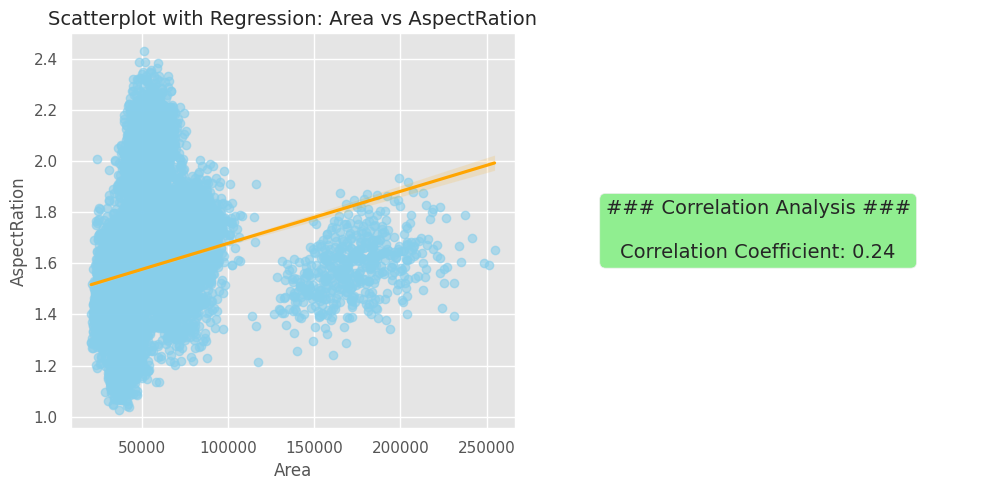

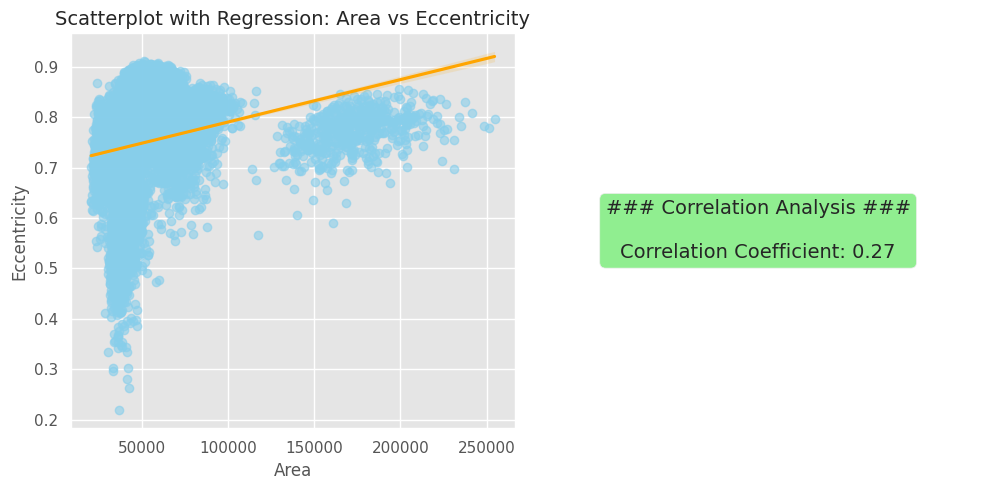

...

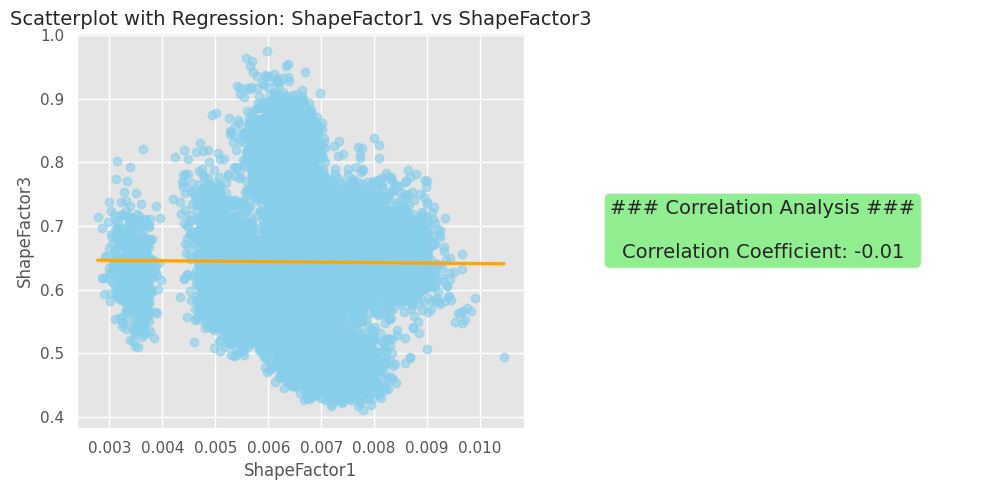

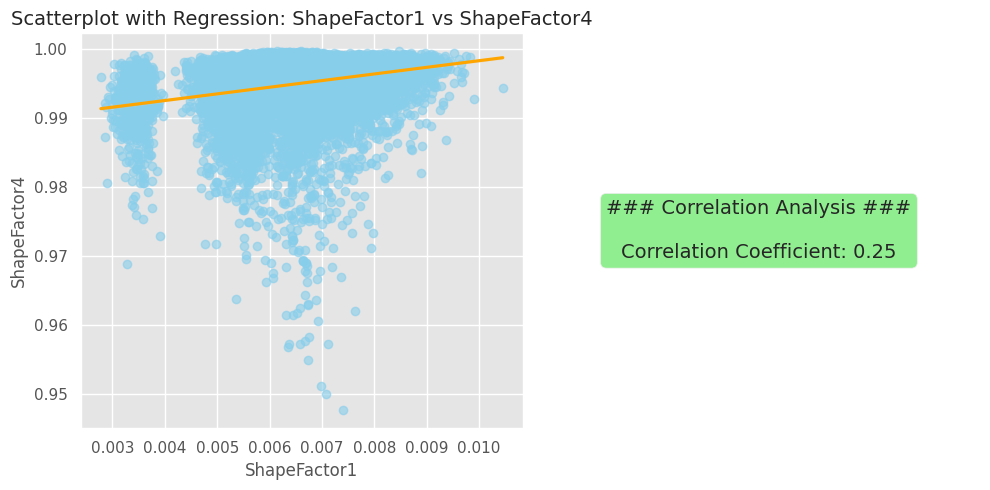

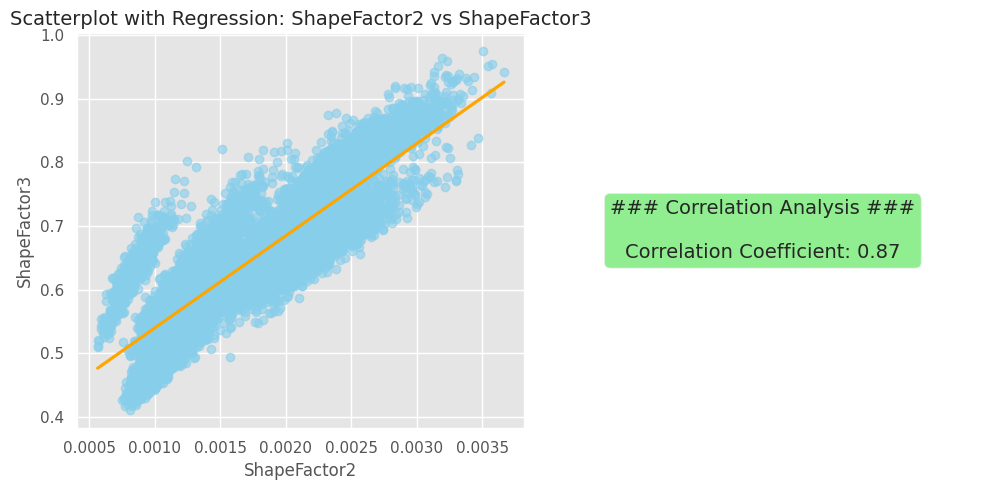

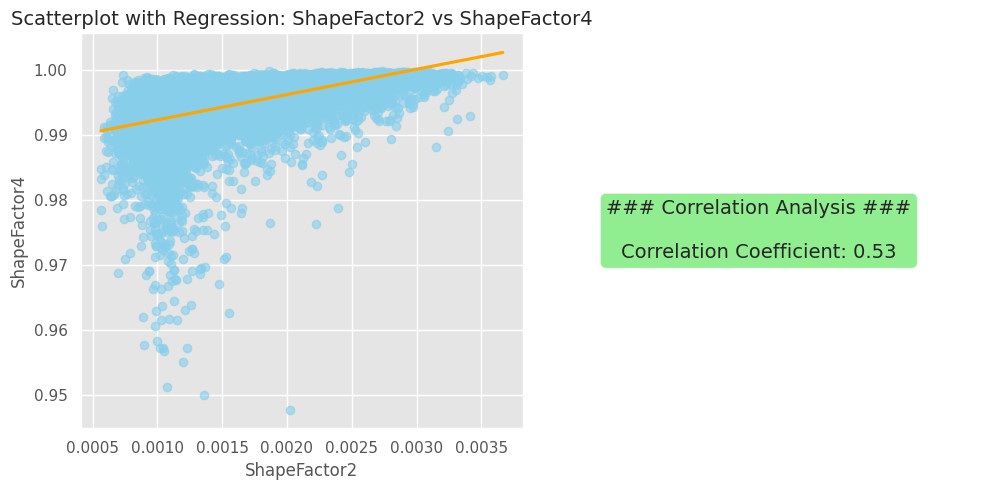

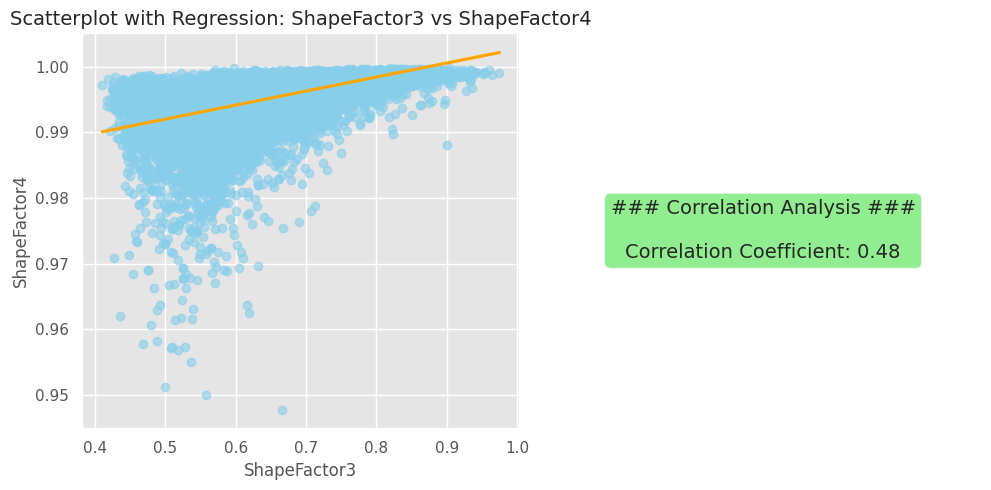

In [ ]:
# List of numerical features
numerical_features = [
    'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
    'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter',
    'Extent', 'Solidity', 'roundness', 'Compactness',
    'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4'
]

# Loop through all pairs of numerical features and call the analysis function
for i in range(len(numerical_features)):
    for j in range(i + 1, len(numerical_features)):
        feature1 = numerical_features[i]
        feature2 = numerical_features[j]
        bivariate_analysis_numerical_numerical(df, feature1, feature2)


##### **Second Type: Numerical-Categorical**

**Funtion For Bivariate Analysis of Numerical- Categorical Combination Of Features**

In [ ]:
def bivariate_analysis_numerical_categorical(df, numerical_feature, categorical_feature):
    """
    Perform bivariate analysis between a numerical feature and a categorical feature.

    Parameters:
        df (pd.DataFrame): The dataframe containing the data.
        numerical_feature (str): The column name of the numerical feature.
        categorical_feature (str): The column name of the categorical feature.
    """
    # Set up a canvas for plotting
    fig, axs = plt.subplots(3, 1, figsize=(14, 16))  # 3 rows, 1 column layout

    # Bar Plot
    sns.barplot(x=categorical_feature, y=numerical_feature, data=df, ax=axs[0], ci=None, palette='Set2')
    axs[0].set_title(f'Bar Plot: {numerical_feature} by {categorical_feature}', fontsize=14)
    axs[0].set_xlabel(categorical_feature, fontsize=12)
    axs[0].set_ylabel(numerical_feature, fontsize=12)

    # Box Plot
    sns.boxplot(x=categorical_feature, y=numerical_feature, data=df, ax=axs[1], palette='Set3')
    axs[1].set_title(f'Box Plot: {numerical_feature} by {categorical_feature}', fontsize=14)
    axs[1].set_xlabel(categorical_feature, fontsize=12)
    axs[1].set_ylabel(numerical_feature, fontsize=12)

    # KDE Plot
    for category in df[categorical_feature].dropna().unique():
        subset = df[df[categorical_feature] == category]
        sns.kdeplot(subset[numerical_feature], ax=axs[2], label=str(category), fill=True)
    axs[2].set_title(f'KDE Plot: {numerical_feature} by {categorical_feature}', fontsize=14)
    axs[2].set_xlabel(numerical_feature, fontsize=12)
    axs[2].set_ylabel('Density', fontsize=12)
    axs[2].legend(title=categorical_feature)

    # Adjust layout
    plt.tight_layout()
    plt.show()


###### **Area By Class**

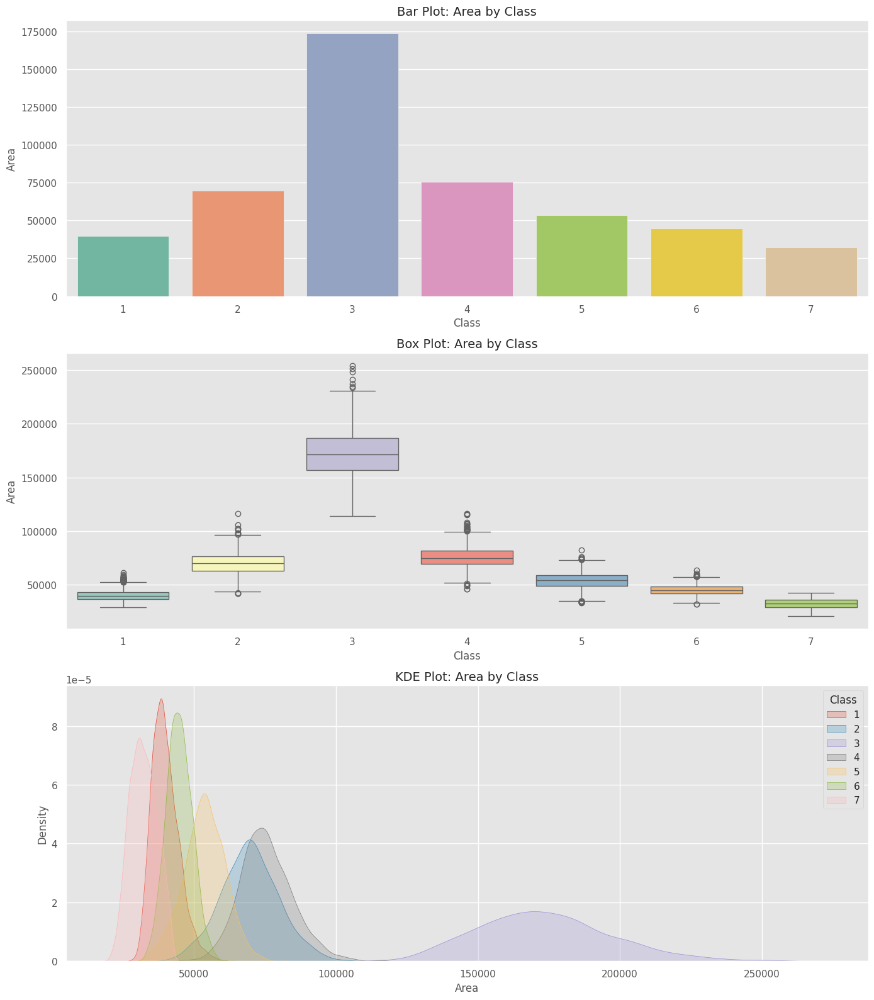

In [ ]:
bivariate_analysis_numerical_categorical(df,'Area','Class')

###### **Perimeter By Class**

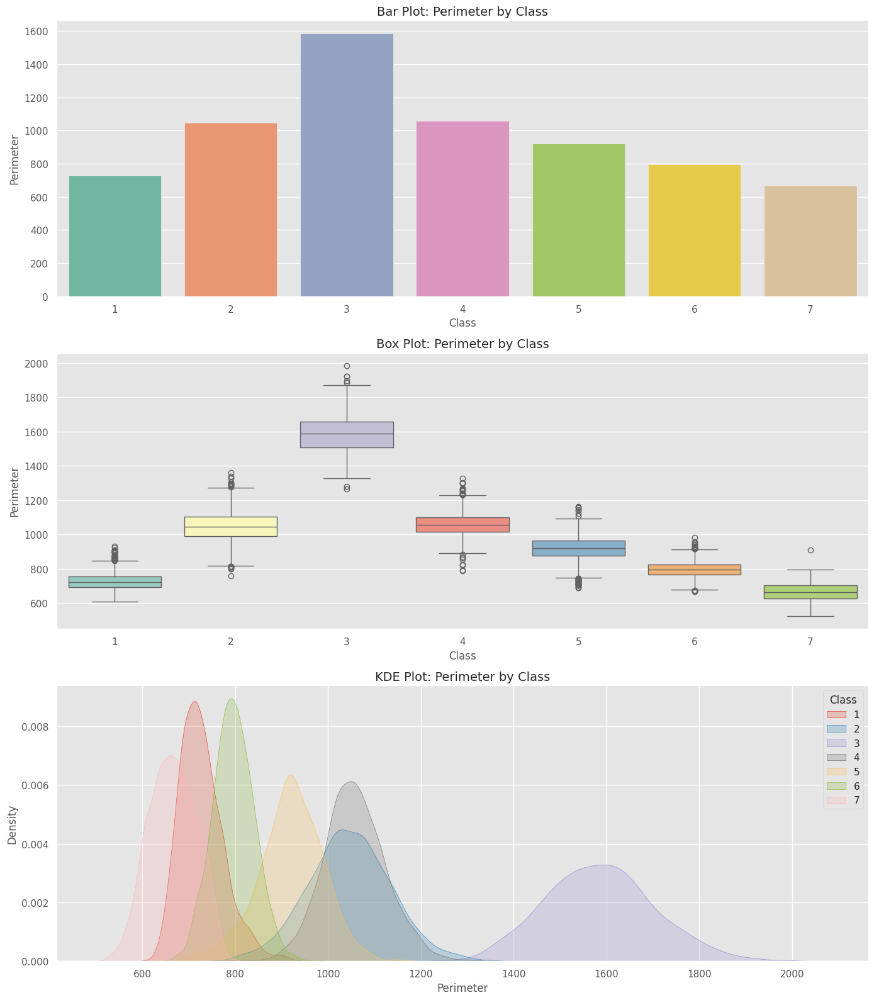

In [ ]:
bivariate_analysis_numerical_categorical(df,'Perimeter','Class')

###### **MajorAxisLength By Class**

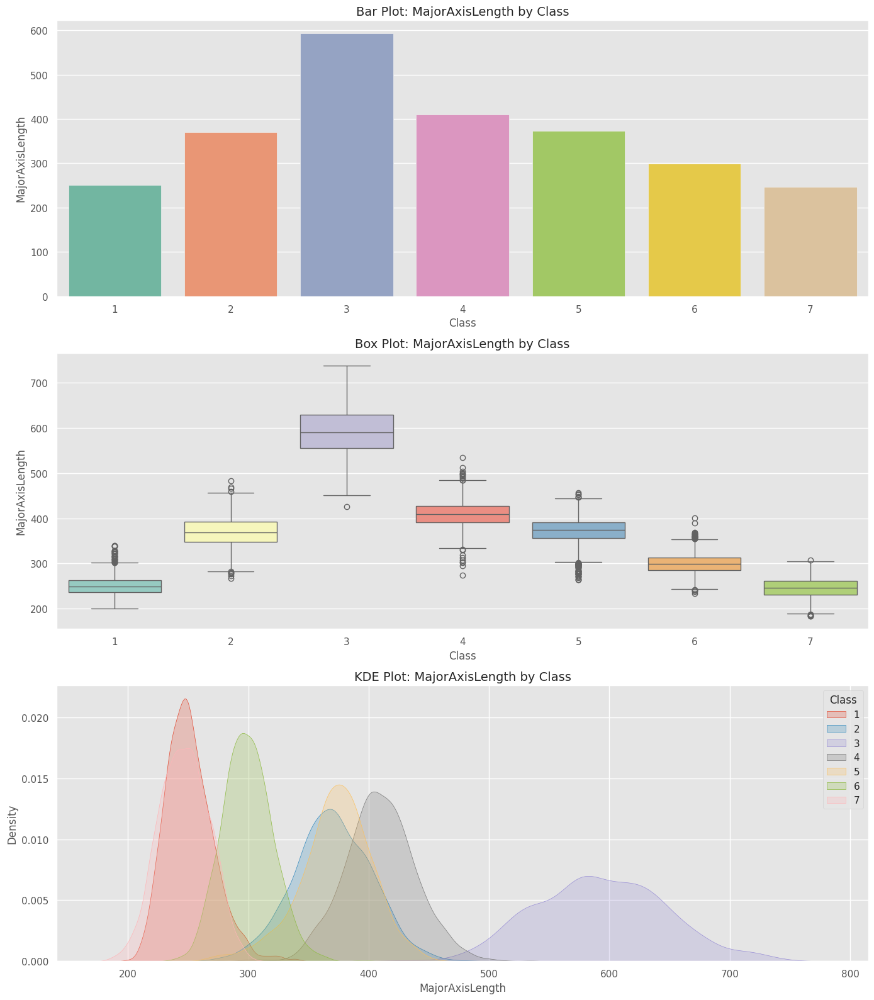

In [ ]:
bivariate_analysis_numerical_categorical(df,'MajorAxisLength','Class')

###### **MinorAxisLength By Class**

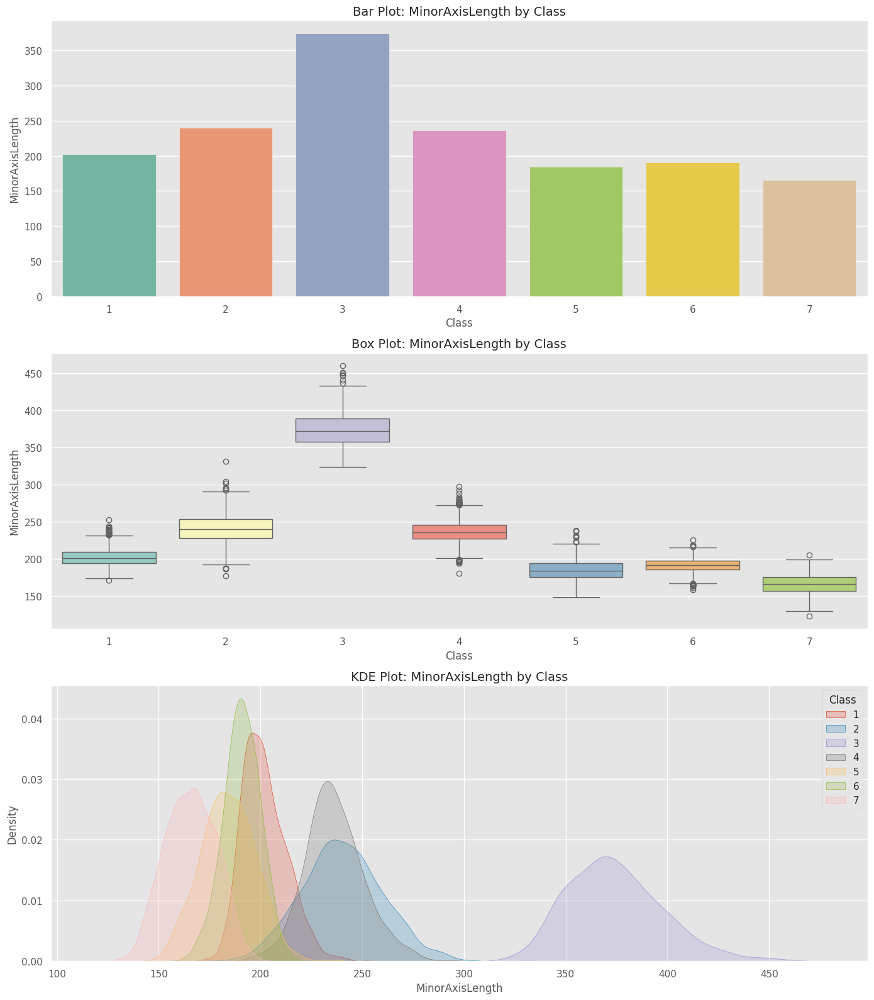

In [ ]:
bivariate_analysis_numerical_categorical(df,'MinorAxisLength','Class')

###### **AspectRation By Class**

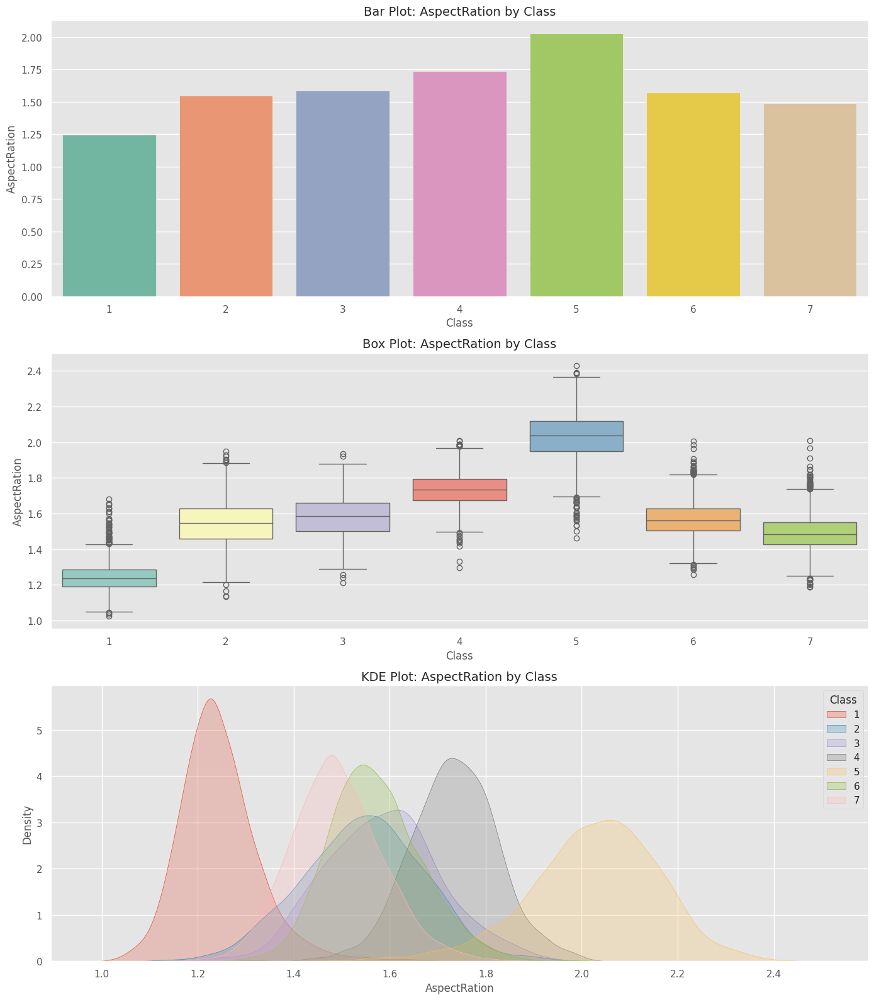

In [ ]:
bivariate_analysis_numerical_categorical(df,'AspectRation','Class')

###### **Eccentricity By Class**

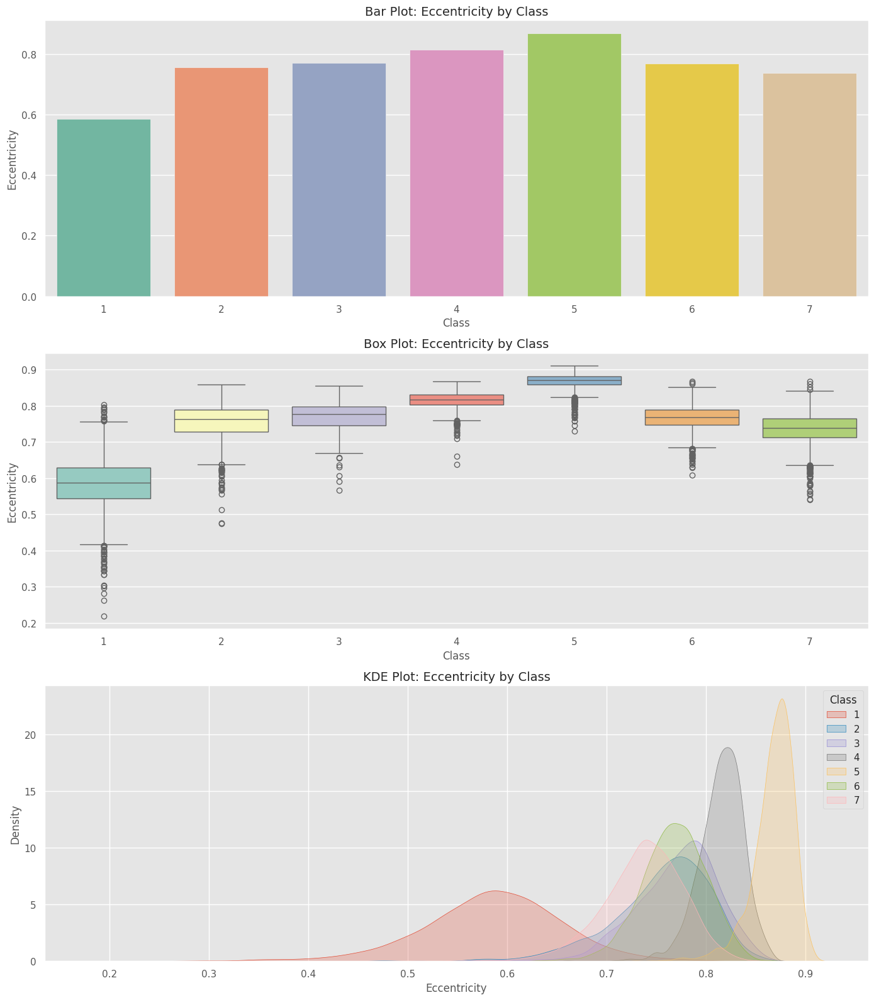

In [ ]:
bivariate_analysis_numerical_categorical(df,'Eccentricity','Class')

###### **ConvexArea By Class**

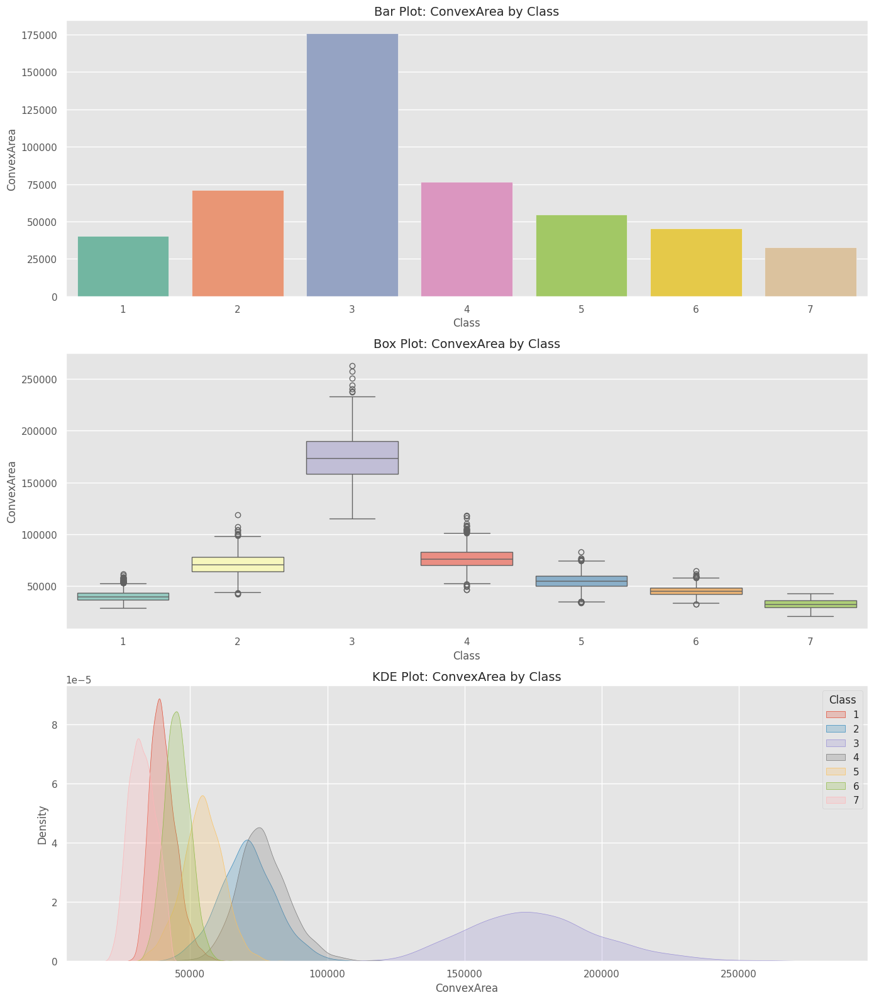

In [ ]:
bivariate_analysis_numerical_categorical(df,'ConvexArea','Class')

###### **EquivDiameter By Class**

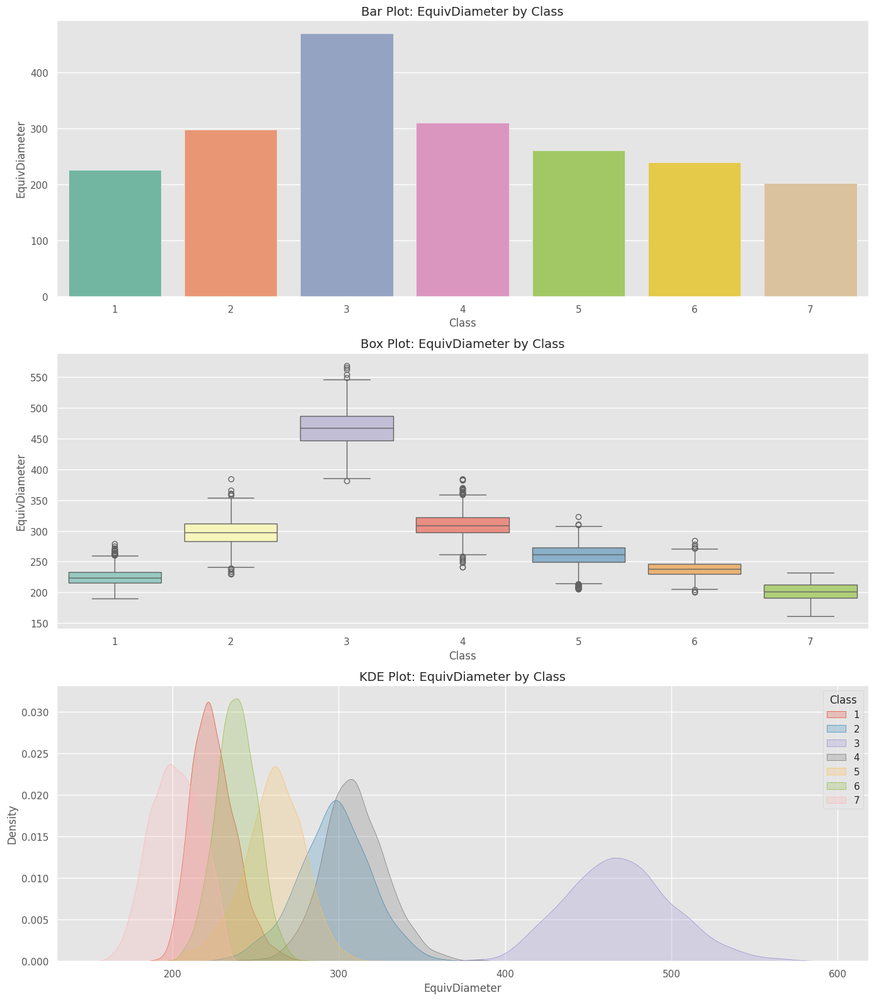

In [ ]:
bivariate_analysis_numerical_categorical(df,'EquivDiameter','Class')

###### **Extent By Class**

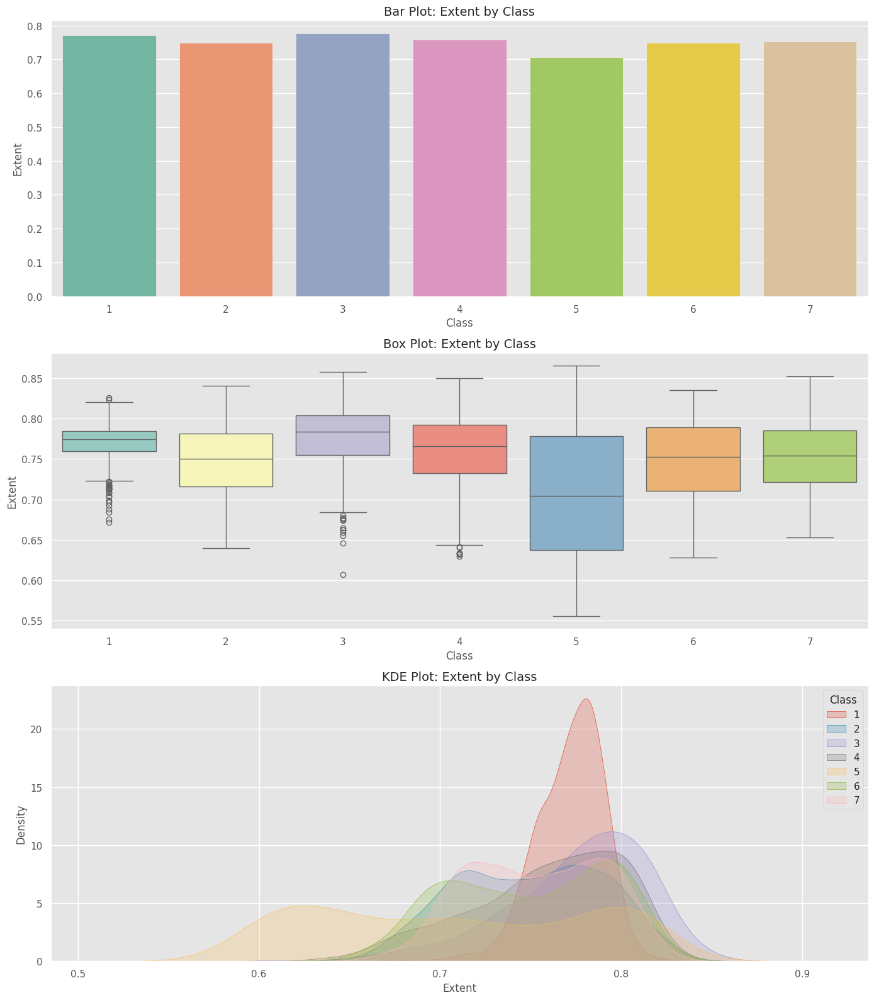

In [ ]:
bivariate_analysis_numerical_categorical(df,'Extent','Class')

###### **Solidity By Class**

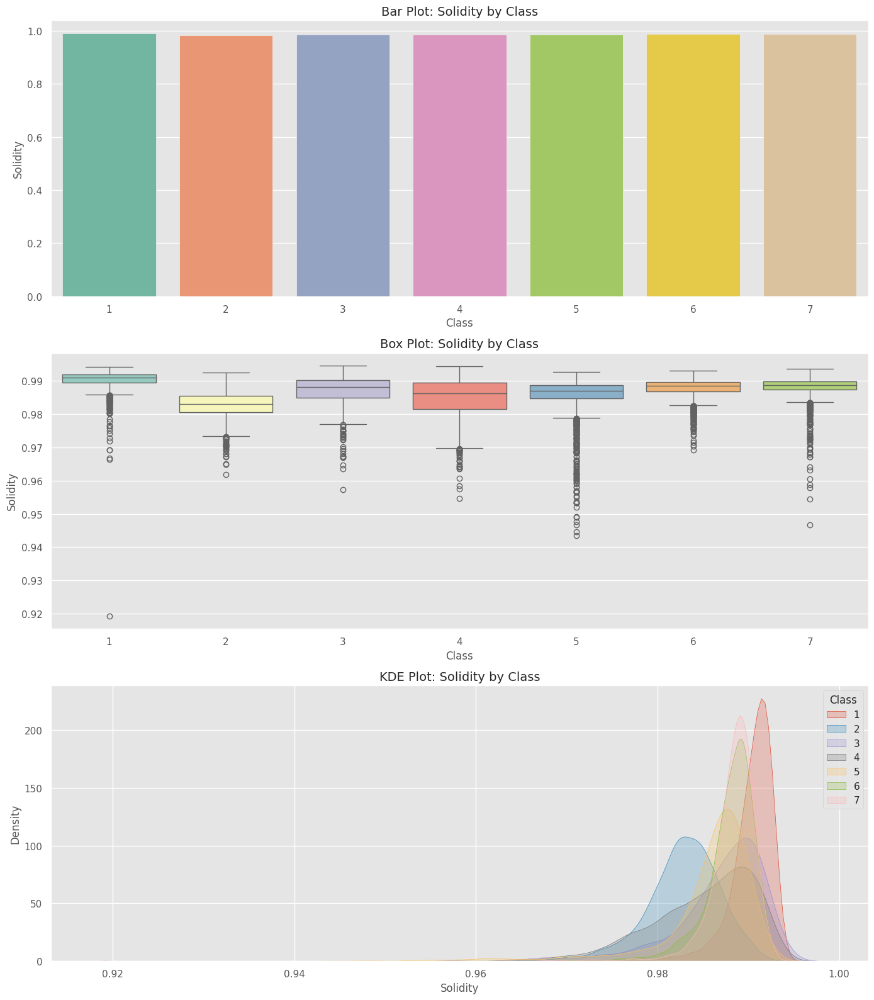

In [ ]:
bivariate_analysis_numerical_categorical(df,'Solidity','Class')

###### **roundness By Class**

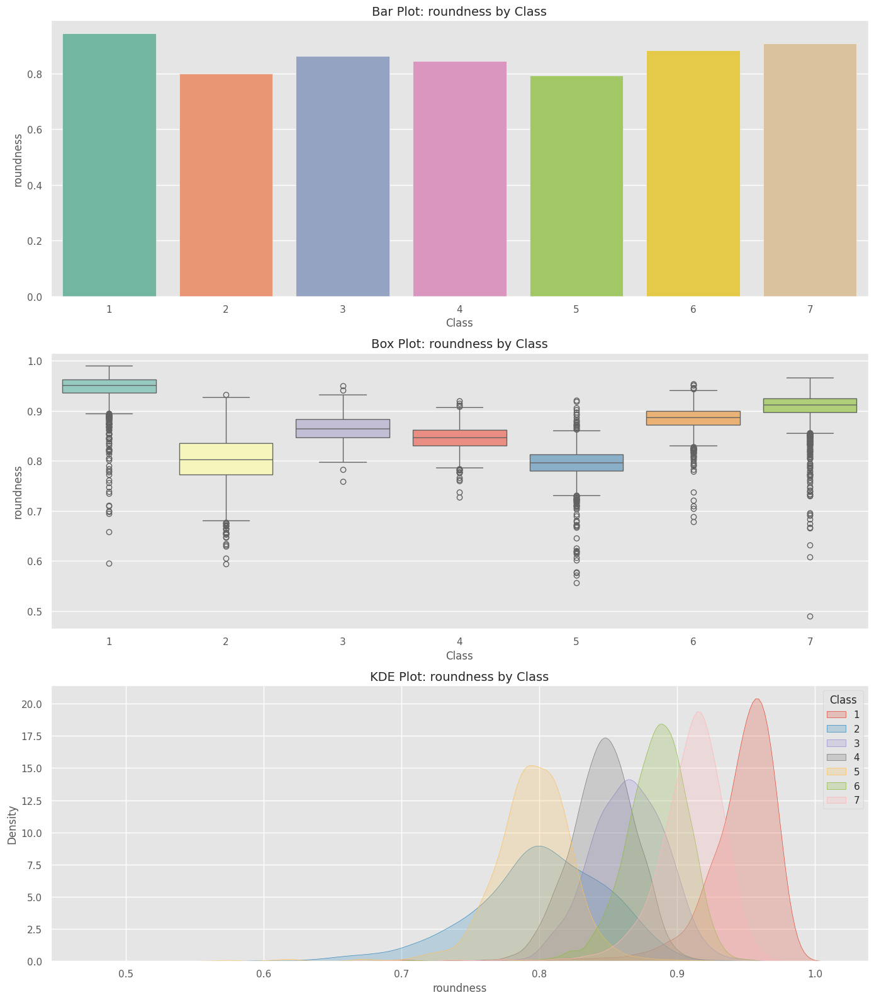

In [ ]:
bivariate_analysis_numerical_categorical(df,'roundness','Class')

###### **Compactness By Class**

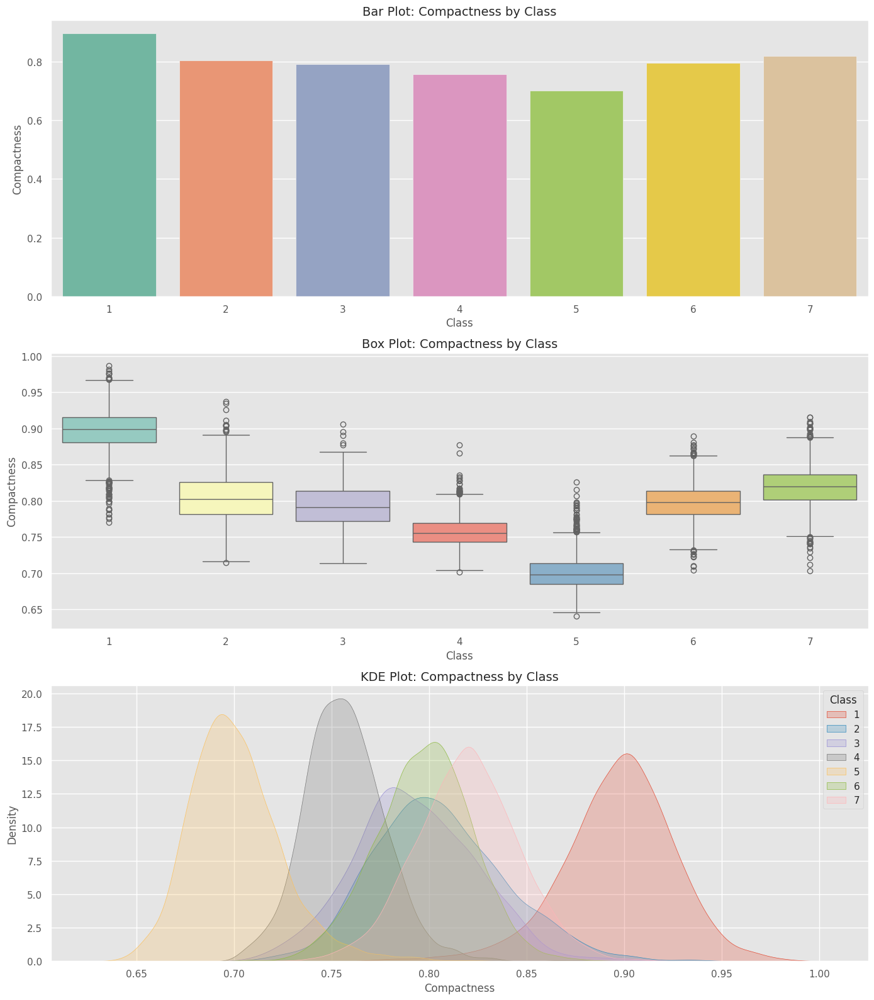

In [ ]:
bivariate_analysis_numerical_categorical(df,'Compactness','Class')

###### **ShapeFactor1 By Class**

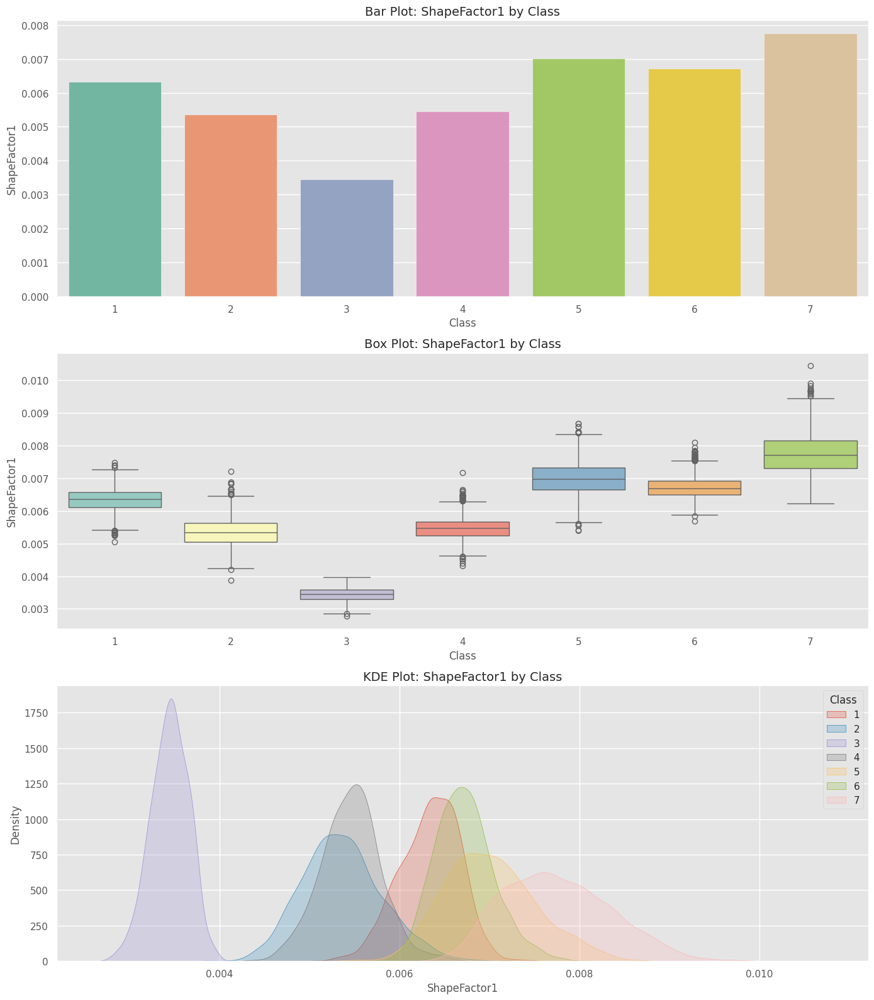

In [ ]:
bivariate_analysis_numerical_categorical(df,'ShapeFactor1','Class')

###### **ShapeFactor2 By Class**

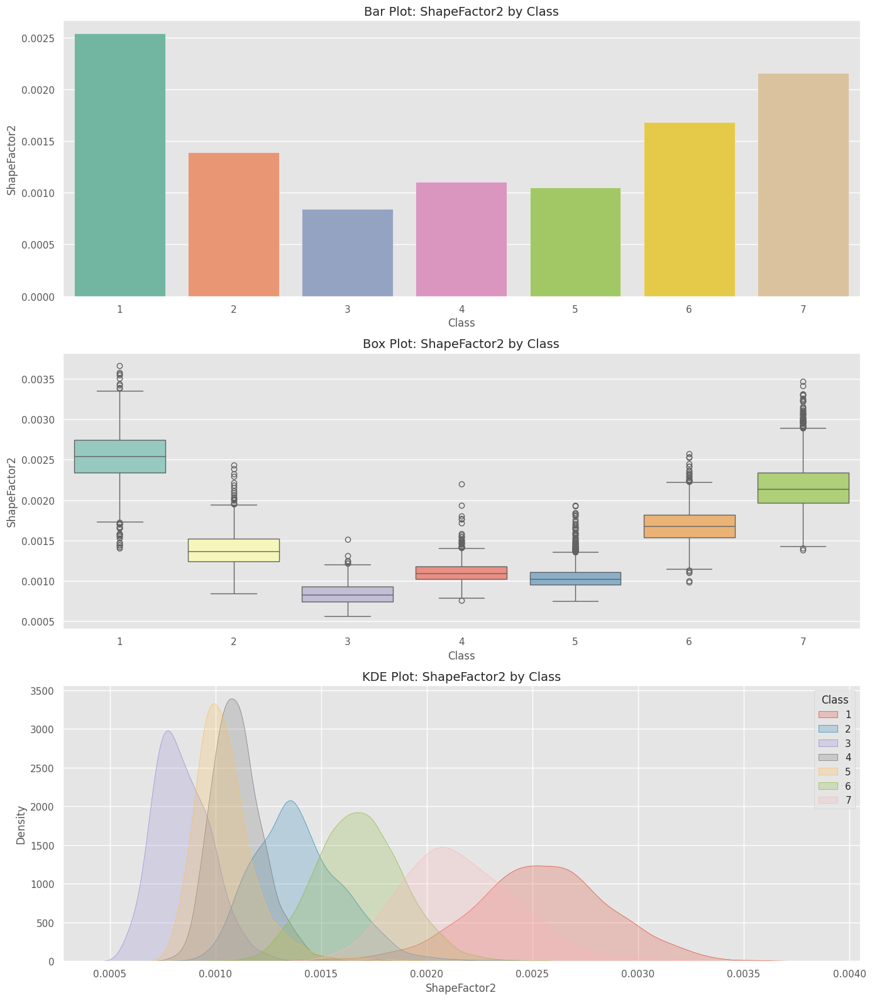

In [ ]:
bivariate_analysis_numerical_categorical(df,'ShapeFactor2','Class')

###### **ShapeFactor3 By Class**

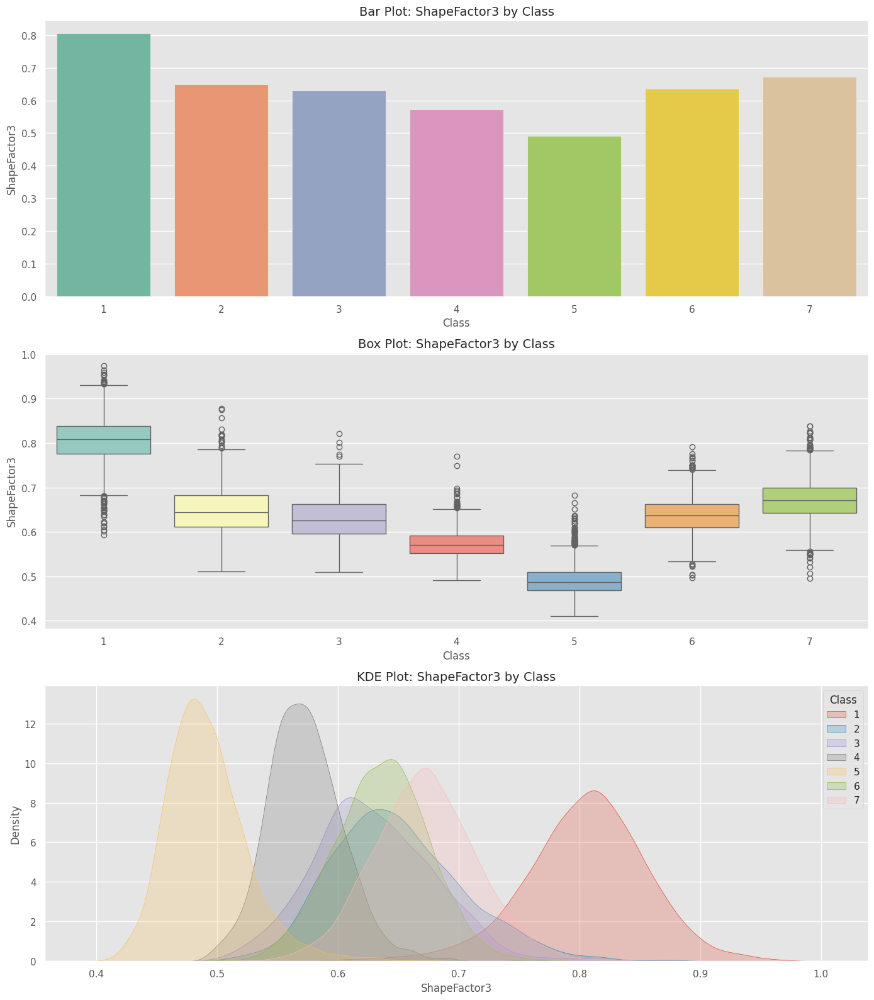

In [ ]:
bivariate_analysis_numerical_categorical(df,'ShapeFactor3','Class')

###### **ShapeFactor4 By Class**

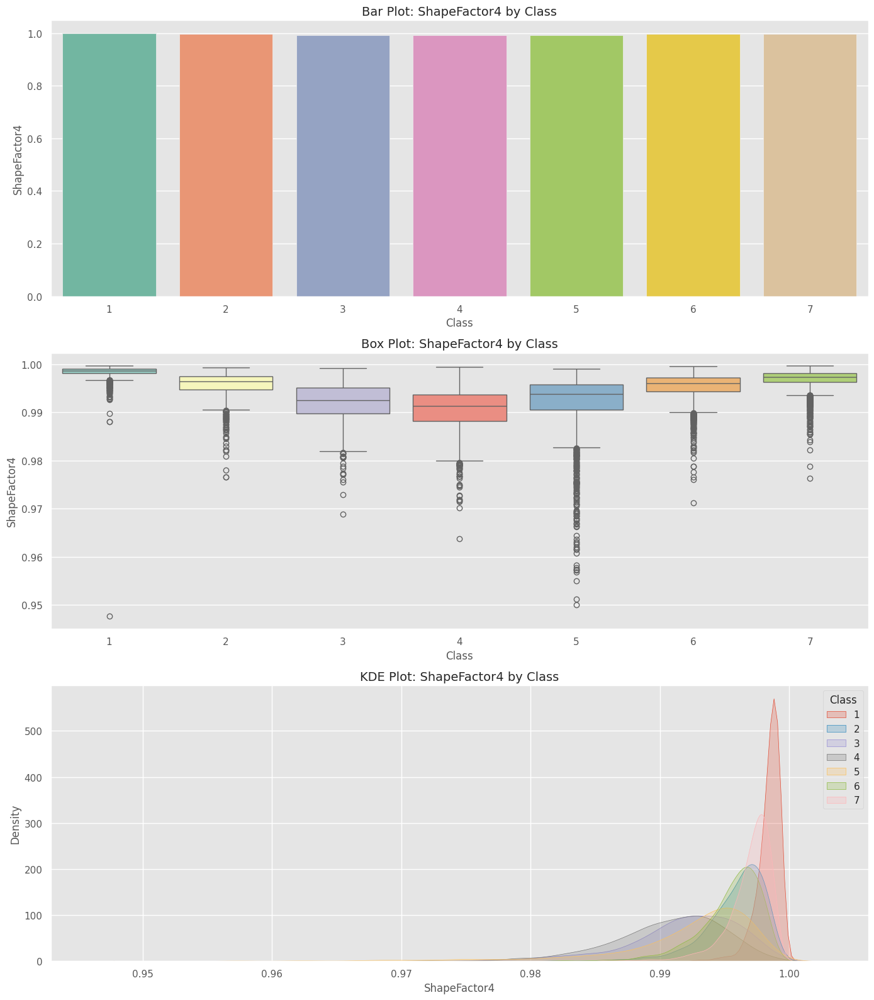

In [ ]:
bivariate_analysis_numerical_categorical(df,'ShapeFactor4','Class')

### **2.2.2 Investigation Of Correlation Matrix**

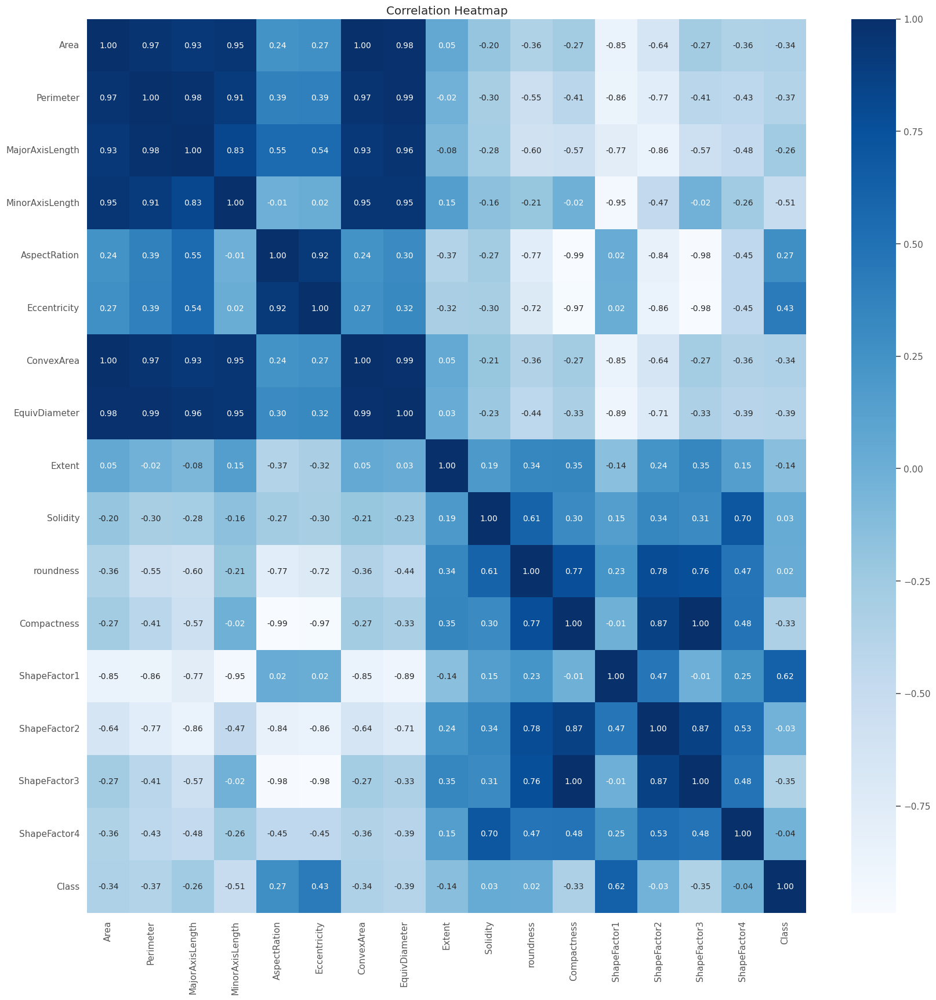

In [ ]:
corr = df.corr()
plt.figure(figsize=(20, 20))
plt.title('Correlation Heatmap')
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f')
plt.show()

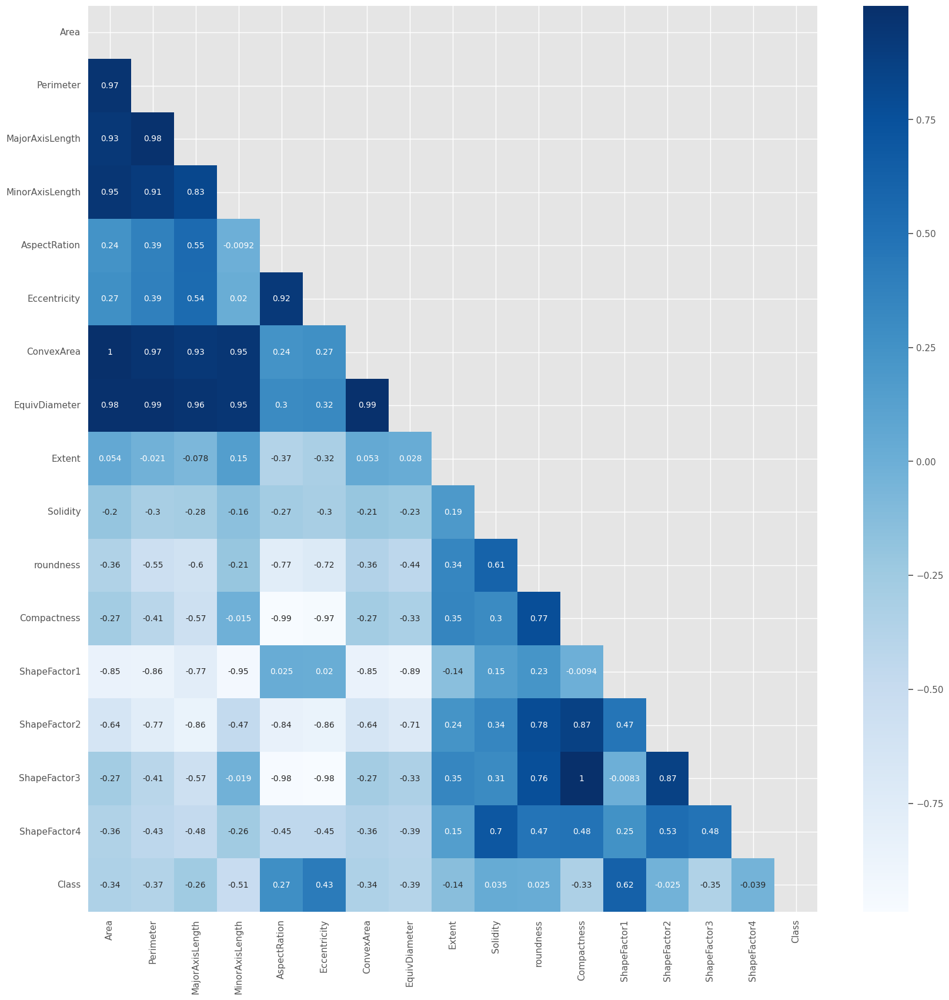

In [ ]:
# Generate a correlation matrix
corr = df.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(20, 20))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

##### **Analysis**


---


**1. Highly Correlated Features**

First Group:
  * Area
  * Perimeter
  * MajorAxisLength
  * MinorAxisLength
  * ConvexArea
  * EquivDiameter

Second Group:
 * Compactness
 * ShapeFactor3
 * ShapeFactor2


---


**2. Moderately Correlated Features**

First Group:
 * AspectRatio
 * Eccentricity

Second Group:
 * Roundness
 * Solidity


---


**3. Weakly Correlated Features**
* Extent
* Class
* ShapeFactor4


### **2.2.3 Data Imbalance**

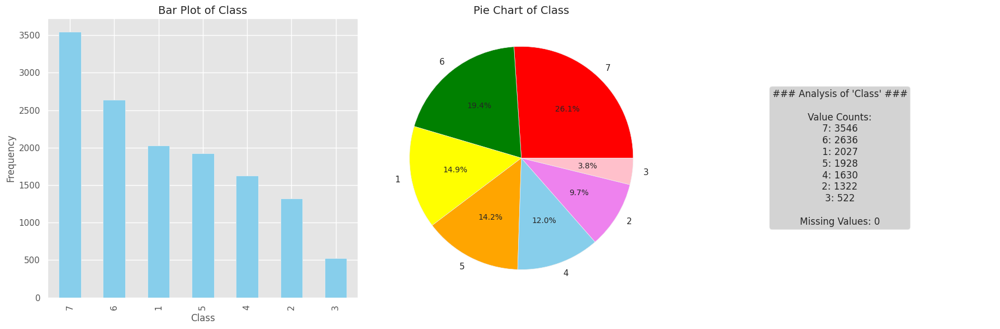

In [ ]:
analyze_categorical_variable(df,'Class')

In [ ]:
# calculating the imbalance ratio of Class
class_counts = df['Class'].value_counts()


majority_class = class_counts.max()
minority_class = class_counts.min()

#  Calculate the imbalance ratio
imbalance_ratio = majority_class / minority_class

imbalance_ratio

6.793103448275862

##### **Analyzing Class Imbalance Ratio**
* IR = 1: Perfectly balanced dataset
* 1 < IR ≤ 3: Mild imbalance
* IR > 3: Significant imbalance


---


**According to this, our data is highly imbalanced**


---



### **2.2.4 Preprocessing**

**Creating a copy of dataset df as df_copy**

---



In [ ]:
df_copy = df.copy()

#### **2.2.4.1 Handling Missing Data And Duplicated Data**

**From EDA, it is evident that there is no missing value in the data.**

---



In [ ]:
df.isnull().sum()

,0
Area,0
Perimeter,0
MajorAxisLength,0
MinorAxisLength,0
AspectRation,0
Eccentricity,0
ConvexArea,0
EquivDiameter,0
Extent,0
Solidity,0


In [ ]:
df.duplicated().sum()

68

In [ ]:
# checking for duplicated rows
df[df.duplicated()]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
5505,33518,702.956,277.571399,154.305581,1.798842,0.831240,34023,206.582775,0.808383,0.985157,0.852377,0.744251,0.008281,0.001567,0.553909,0.996396,5
5509,33954,716.750,277.368480,156.356326,1.773951,0.825970,34420,207.922042,0.799482,0.986461,0.830549,0.749624,0.008169,0.001591,0.561936,0.996847,5
5548,38427,756.323,306.533886,160.591784,1.908777,0.851782,38773,221.193978,0.796976,0.991076,0.844174,0.721597,0.007977,0.001334,0.520702,0.993905,5
5554,38891,791.343,319.499996,156.869619,2.036723,0.871168,39651,222.525412,0.650025,0.980833,0.780422,0.696480,0.008215,0.001192,0.485085,0.987983,5
5599,40804,790.802,323.475648,163.287717,1.981016,0.863241,41636,227.932592,0.787570,0.980017,0.819931,0.704636,0.007928,0.001206,0.496512,0.983598,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7263,63408,1005.966,412.551649,196.337705,2.101235,0.879494,64200,284.136540,0.798791,0.987664,0.787385,0.688730,0.006506,0.000903,0.474348,0.996718,5
7278,63882,1004.206,411.263403,198.765453,2.069089,0.875452,64663,285.196579,0.754705,0.987922,0.796054,0.693465,0.006438,0.000918,0.480893,0.995010,5
7285,63948,996.497,412.297178,198.877557,2.073121,0.875971,64641,285.343867,0.777909,0.989279,0.809254,0.692083,0.006447,0.000912,0.478979,0.992981,5
7340,65766,1035.842,406.416622,207.242369,1.961069,0.860218,66698,289.371512,0.792295,0.986027,0.770237,0.712007,0.006180,0.000980,0.506954,0.994172,5


In [ ]:
# shape before dropping
print("Dataset before dropping duplicates: ")
print(df.shape)

Dataset before dropping duplicates: 
(13611, 17)


In [ ]:
# dropping duplicates
df.drop_duplicates(inplace=True)

In [ ]:
# shape after dropping duplicates
print("Dataset after dropping duplicates: ")
print(df.shape)

Dataset after dropping duplicates: 
(13543, 17)


#### **2.2.4.2 Feature Scaling**

Feature Scaling is an important step because it is evident in the univariate analysis that most of the features contains alot of outliers but those outliers are present in clusters form. They will definetely play a significant role in predicting outcome. Feature Scaling will help us to cope up with this problem to some extent.

Here i am using log transformation for scaling because the data is highly skewed as it is evident from kde plots, skewness values and histograms in the univariate analysis of the features

In [ ]:
# applying log transformation 3 times
for i in range(3):
  for col in df.columns:
    df[col] = np.log1p(df[col])

In [ ]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1.229852,1.099806,1.046400,1.036294,0.457829,0.309942,1.230143,1.041359,0.371224,0.420868,0.414744,0.405521,0.007252,0.003133,0.388070,0.422789,0.423036
1,1.230160,1.101789,1.044328,1.039118,0.441009,0.259503,1.230552,1.041692,0.376167,0.420110,0.399881,0.413902,0.006906,0.003545,0.404779,0.422732,0.423036
2,1.230736,1.100807,1.047614,1.036961,0.459836,0.314154,1.231008,1.042314,0.374735,0.421006,0.412680,0.404550,0.007166,0.003034,0.386138,0.422855,0.423036
3,1.231283,1.102334,1.047025,1.039051,0.450676,0.292454,1.231891,1.042905,0.375853,0.418475,0.403520,0.408660,0.006944,0.003199,0.394321,0.421910,0.423036
4,1.231396,1.100522,1.044693,1.041399,0.434455,0.225577,1.231632,1.043028,0.373501,0.421266,0.420088,0.417248,0.006630,0.003645,0.411463,0.422874,0.423036


#### **2.2.4.3 Encoding Categorical Variables**

**There is only one categorical column that ranges from 1 to 7. So, there is no need of encoding.**

---



#### **2.2.4.4 Outlier Detection**




it is evident in the univariate analysis that most of the features contains alot of outliers but those outliers are present in clusters form. They will definetely play a significant role in predicting outcome.

Strategy for outliers here a threshold for the outliers will be defined for filtering them out of the data. The Boxplots in the univariate analysis have given fair enough idea about the outliers.

relaxing threshold beacause data is highly positively skewed for many variable. Important data can be lost if threshold is 3 because 8.5% of the data is outliers in this case.

In [ ]:
from scipy import stats

# Calculate Z-scores for all numerical columns
z_scores = np.abs(stats.zscore(df.select_dtypes(include=np.number)))

# Define a threshold for identifying outliers (e.g., Z-score > 3)
threshold = 3

# Identify rows with outliers in any column
outlier_rows = np.where(z_scores > threshold)

# Get the indices of the rows containing outliers
outlier_indices = list(set(outlier_rows[0]))

# printing the number of rows containing outliers
print("Number of rows containing outliers:", len(outlier_indices))

Number of rows containing outliers: 1149


In [ ]:
# calculating the percentage of outliers with complete dataset
percentage_outliers = (len(outlier_indices) / len(df)) * 100
percentage_outliers

8.484087720593665

In [ ]:
from scipy import stats

# Calculate Z-scores for all numerical columns
z_scores = np.abs(stats.zscore(df.select_dtypes(include=np.number)))

# Define a threshold for identifying outliers (e.g., Z-score > 3)
threshold = 3.5

# Identify rows with outliers in any column
outlier_rows = np.where(z_scores > threshold)

# Get the indices of the rows containing outliers
outlier_indices = list(set(outlier_rows[0]))

# printing the number of rows containing outliers
print("Number of rows containing outliers:", len(outlier_indices))

Number of rows containing outliers: 481


In [ ]:
# calculating the percentage of outliers with complete dataset
percentage_outliers = (len(outlier_indices) / len(df)) * 100
percentage_outliers

3.5516502990474783

In [ ]:
# Access the rows with outliers using the outlier_indices
outlier_rows_df = df.iloc[outlier_indices]
outlier_rows_df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
6168,1.244594,1.117323,1.077246,1.037270,0.566178,0.399029,1.245482,1.057335,0.349304,0.415961,0.371860,0.348121,0.007306,0.000951,0.277287,0.418040,0.706395
1,1.230160,1.101789,1.044328,1.039118,0.441009,0.259503,1.230552,1.041692,0.376167,0.420110,0.399881,0.413902,0.006906,0.003545,0.404779,0.422732,0.423036
4097,1.250868,1.122076,1.078650,1.049711,0.530489,0.385166,1.251592,1.064160,0.350325,0.417107,0.377956,0.367412,0.005801,0.001133,0.313490,0.419870,0.672503
6170,1.244614,1.117854,1.077224,1.036179,0.569532,0.400018,1.244931,1.057358,0.322185,0.420512,0.367174,0.348287,0.007296,0.000953,0.277592,0.421983,0.706395
4,1.231396,1.100522,1.044693,1.041399,0.434455,0.225577,1.231632,1.043028,0.373501,0.421266,0.420088,0.417248,0.006630,0.003645,0.411463,0.422874,0.423036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4064,1.250564,1.121666,1.078983,1.048737,0.535079,0.387366,1.251362,1.063829,0.365491,0.416506,0.379311,0.364890,0.005916,0.001096,0.308680,0.419514,0.672503
6143,1.244475,1.119938,1.077032,1.036153,0.568912,0.399839,1.244925,1.057207,0.321609,0.419459,0.347125,0.348485,0.007309,0.000959,0.277956,0.421724,0.706395
4072,1.250648,1.120558,1.078216,1.049961,0.527971,0.383893,1.251295,1.063921,0.359166,0.417751,0.390332,0.368225,0.005804,0.001153,0.315043,0.418908,0.672503
6151,1.244518,1.118170,1.076683,1.037238,0.564203,0.398426,1.245143,1.057254,0.319302,0.418064,0.363542,0.349989,0.007245,0.000981,0.280729,0.419769,0.706395


In [ ]:
# shape of data with the outliers
print("Dataset with outliers: ")
print(df.shape)

Dataset with outliers: 
(13543, 17)


In [ ]:
# dropping the outliers
df_without_outliers = df.drop(index=df.index[outlier_indices])

In [ ]:
# shape of data without the outliers
print("Dataset without outliers: ")
print(df_without_outliers.shape)

Dataset without outliers: 
(13062, 17)


#### **2.2.4.5 Feature Engineering**

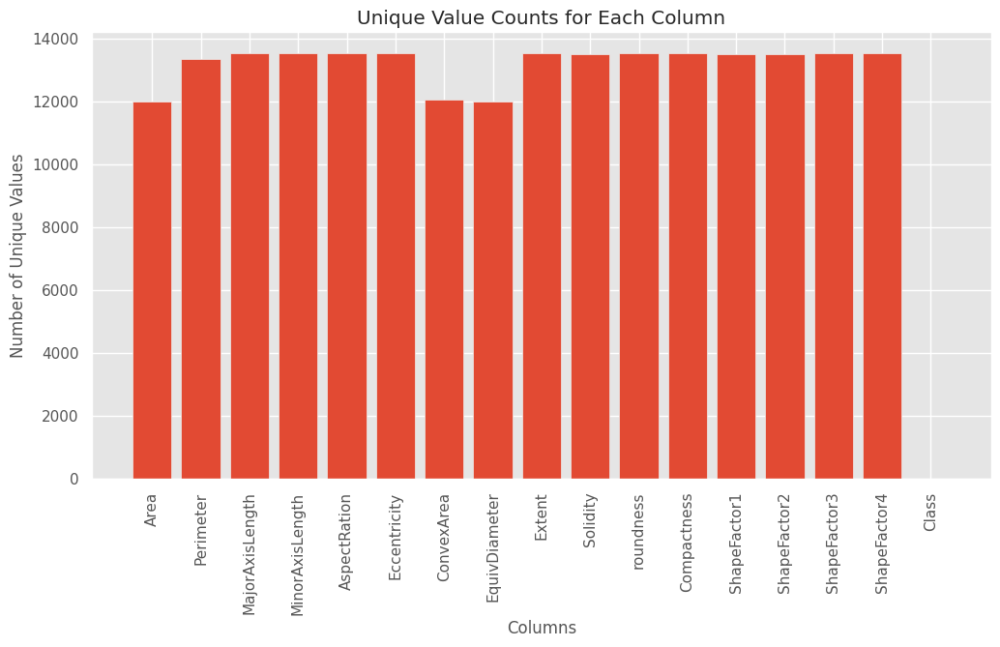

In [ ]:
# Calculate the number of unique values for each column
unique_counts = df.nunique()

# Create a bar plot to visualize the number of unique values for each column
plt.figure(figsize=(12, 6))
plt.bar(unique_counts.index, unique_counts.values)
plt.xticks(rotation=90)
plt.xlabel("Columns")
plt.ylabel("Number of Unique Values")
plt.title("Unique Value Counts for Each Column")
plt.show()

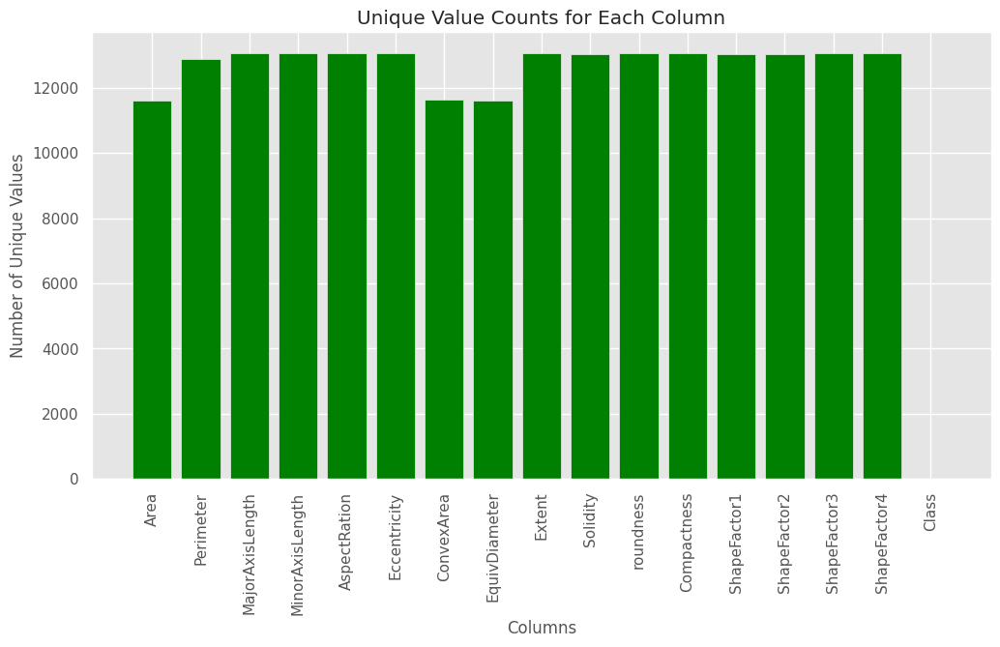

In [ ]:
# Calculate the number of unique values for each column
unique_counts = df_without_outliers.nunique()

# Create a bar plot to visualize the number of unique values for each column
plt.figure(figsize=(12, 6))
plt.bar(unique_counts.index, unique_counts.values, color='green')
plt.xticks(rotation=90)
plt.xlabel("Columns")
plt.ylabel("Number of Unique Values")
plt.title("Unique Value Counts for Each Column")
plt.show()

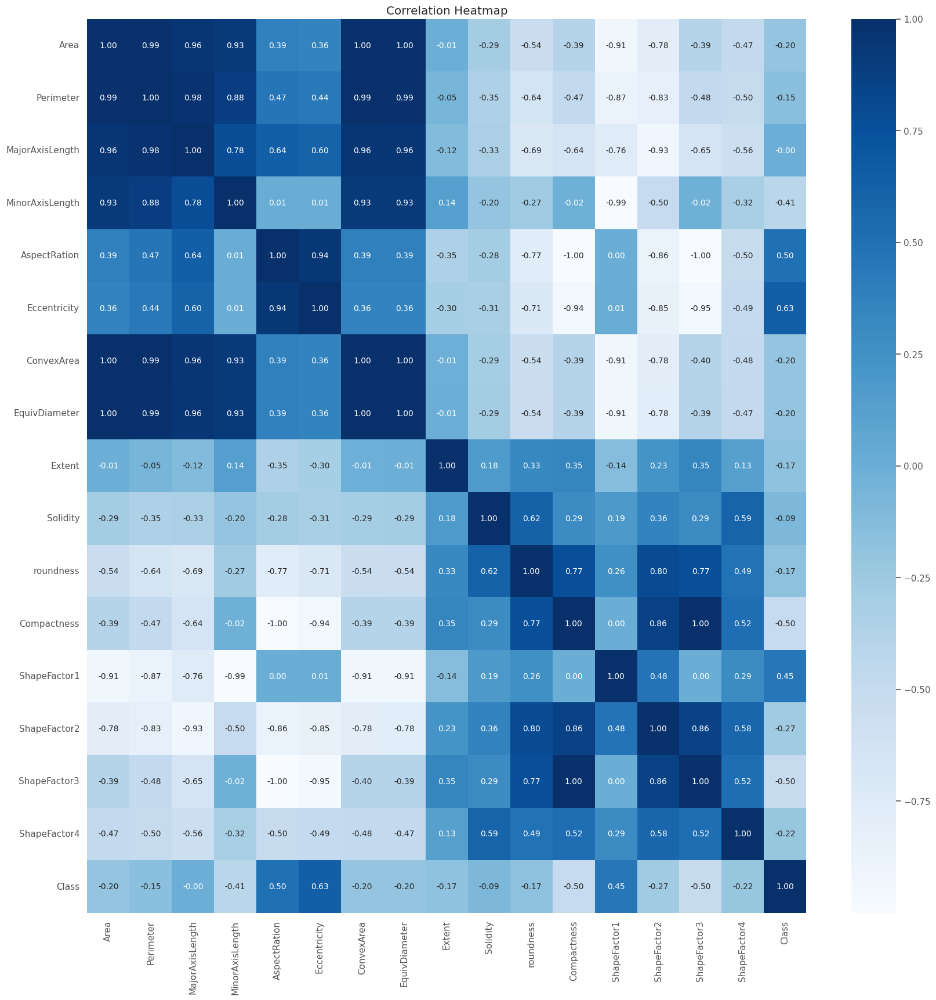

In [ ]:
corr = df_without_outliers.corr()
plt.figure(figsize=(20, 20))
plt.title('Correlation Heatmap')
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f')
plt.show()

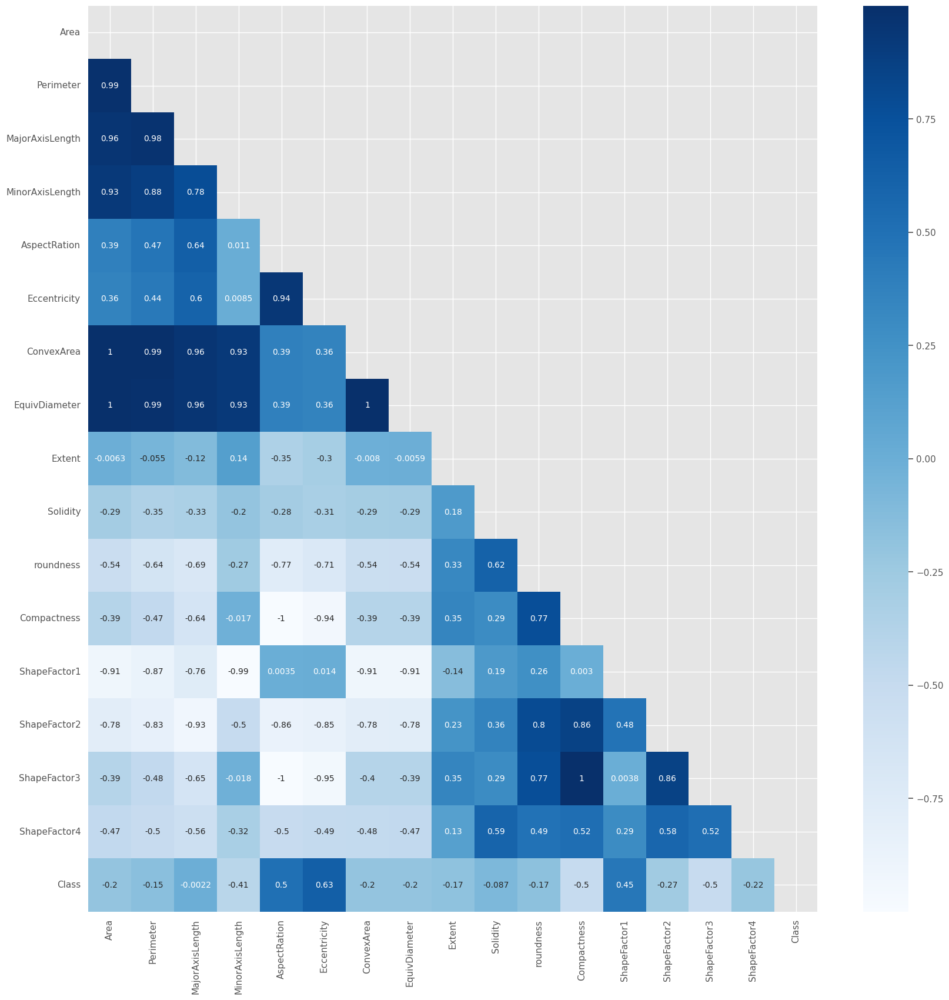

In [ ]:
# Generate a correlation matrix
corr = df_without_outliers.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(20, 20))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

#### **2.2.4.6 Adressing Multicollinearity And Features Selection**

##### **Analysis**


---


**1. Highly Correlated Features**

First Group:
  * Area
  * Perimeter
  * MajorAxisLength
  * MinorAxisLength
  * ConvexArea
  * EquivDiameter

Second Group:
 * Compactness
 * ShapeFactor3
 * ShapeFactor2


---


**2. Moderately Correlated Features**

First Group:
 * AspectRatio
 * Eccentricity

Second Group:
 * Roundness
 * Solidity


---


**3. Weakly Correlated Features**
* Extent
* Class
* ShapeFactor4



---




##### **Features to retain on the basis of above analysis**
* Area
* Compactness
* AspectRatio
* Eccentricity
* Roundness
* Solidity
* Extent
* Class (target variable)
* ShapeFactor4

In [ ]:
# dropping features that are highly correlated
df_without_outliers.drop(['Perimeter','MajorAxisLength','MinorAxisLength','ConvexArea','EquivDiameter','ShapeFactor3','ShapeFactor2'],axis=1,inplace=True)

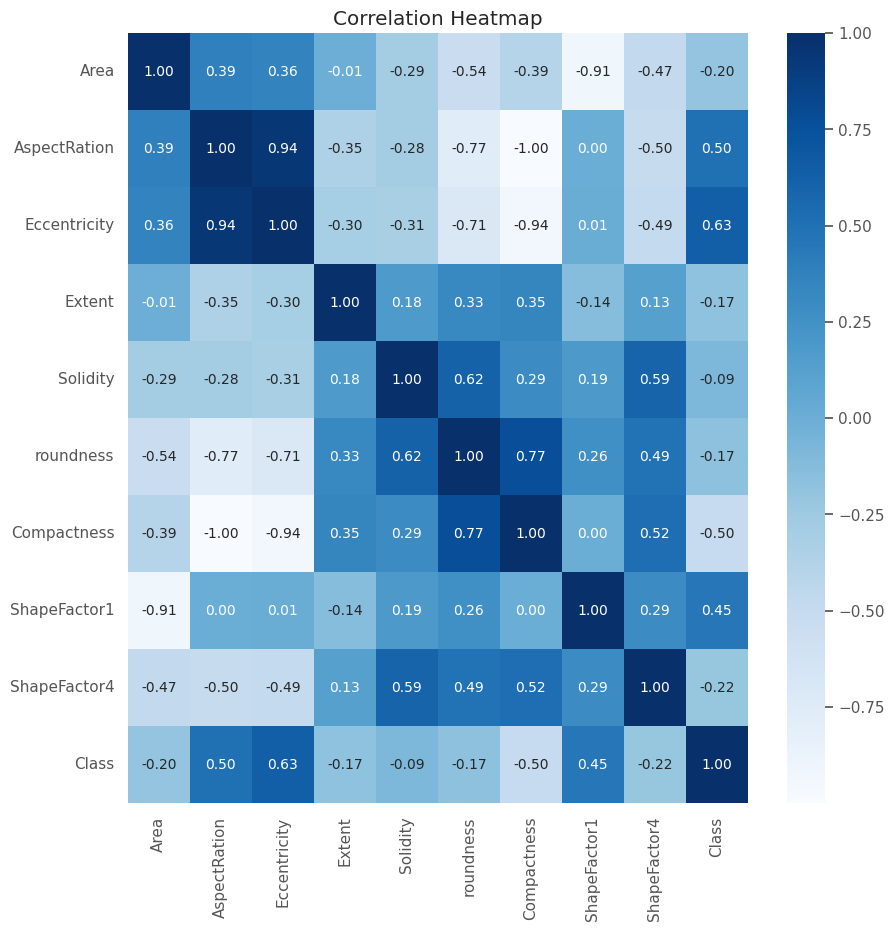

In [ ]:
corr = df_without_outliers.corr()
plt.figure(figsize=(10, 10))
plt.title('Correlation Heatmap')
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f')
plt.show()

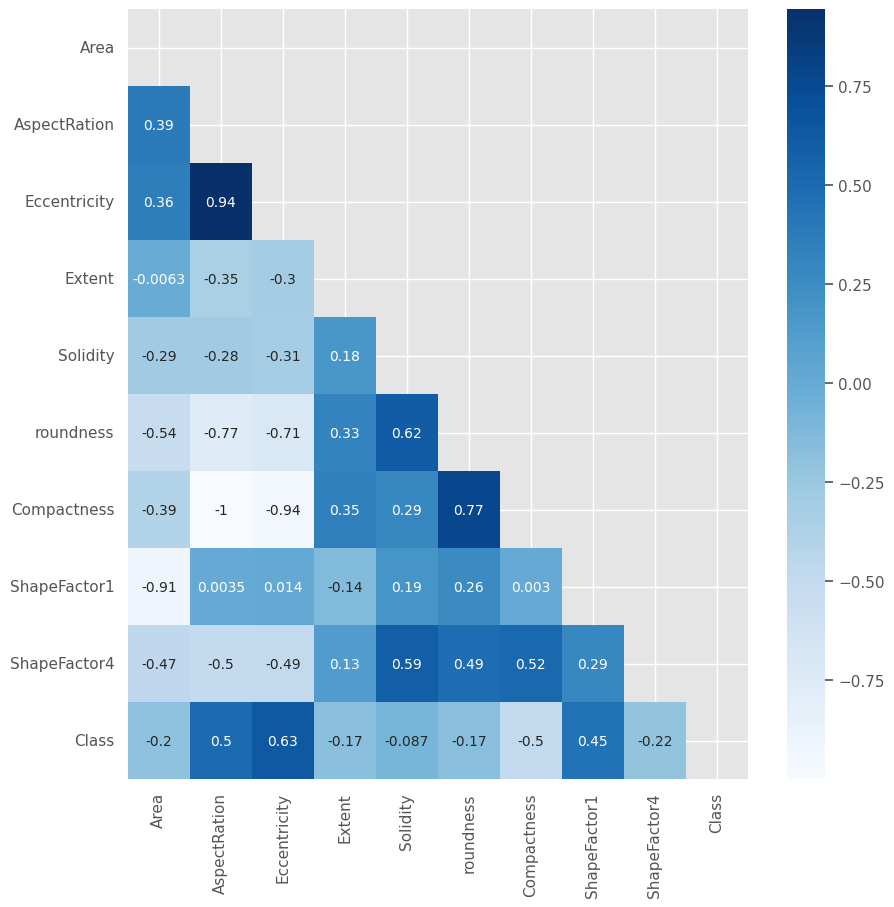

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = df_without_outliers.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

**Eccentricity is highly positively correlated with aspectRatio and highly negatively correlated with compactness. So dropping it**

**ShapeFactor1 is highly negatively correlated with area so dropping it**

In [ ]:
# dropping ShapeFactor1 and Eccentricity
df_without_outliers.drop(['ShapeFactor1','Eccentricity'],axis=1,inplace=True)

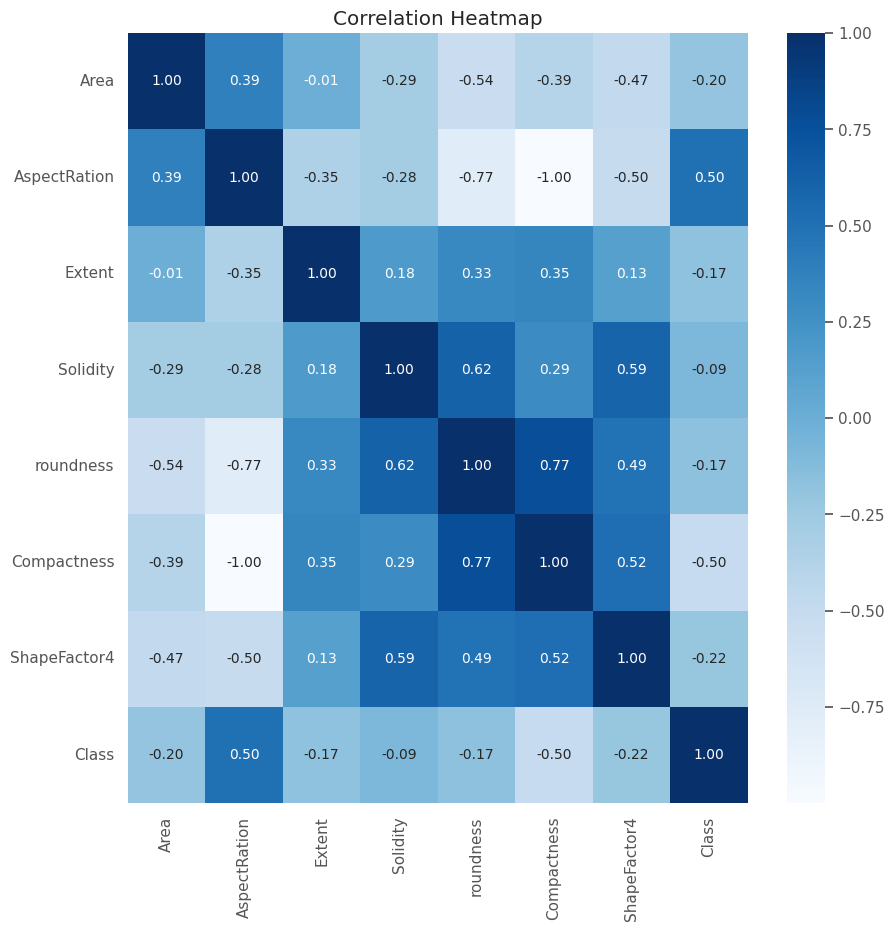

In [ ]:
corr = df_without_outliers.corr()
plt.figure(figsize=(10, 10))
plt.title('Correlation Heatmap')
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f')
plt.show()

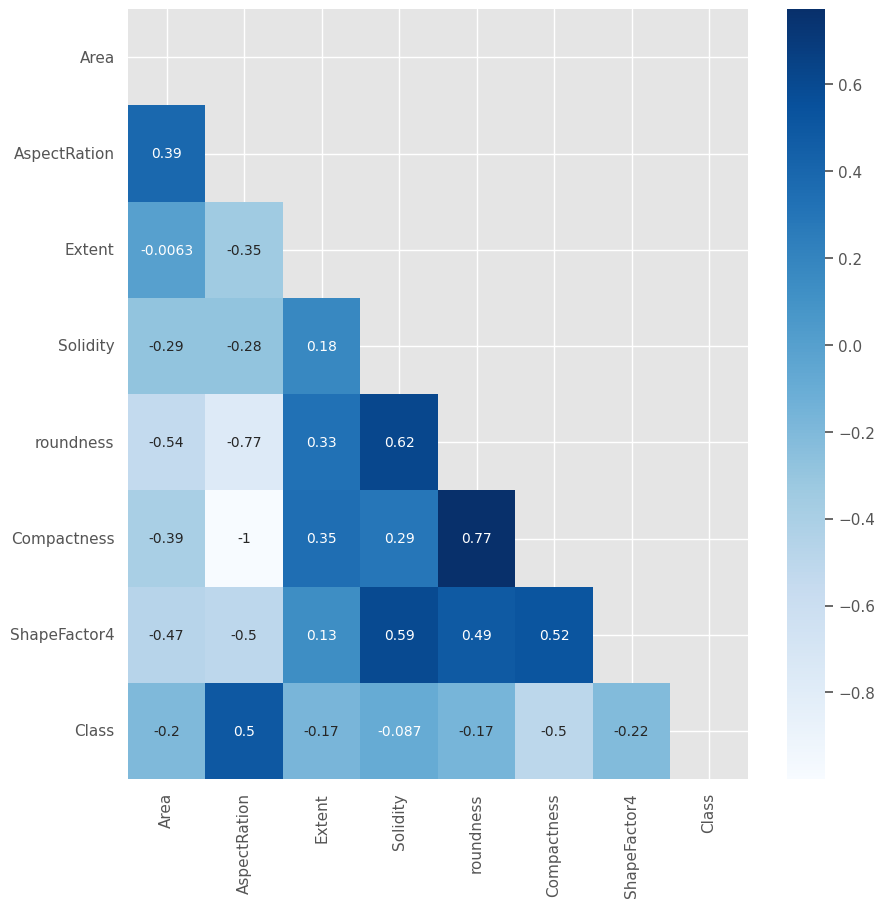

In [ ]:
# correlation matrix
# Generate a correlation matrix
corr = df_without_outliers.corr()
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 10))
# masking the upper triagle repleated values
masking = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, mask= masking, cmap='Blues')
plt.show()

### **2.2.5 Train Test Split**

In [ ]:
# replace the Class of df_without_outliers with df['Class']
df_without_outliers['Class'] = df_copy['Class']

In [ ]:
# 80 - 20 train test splitting
X = df_without_outliers.drop('Class', axis=1)
y = df_without_outliers['Class']

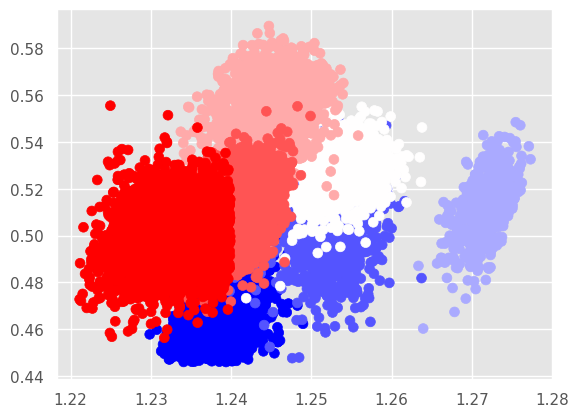

In [ ]:
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, s=50, cmap='bwr')

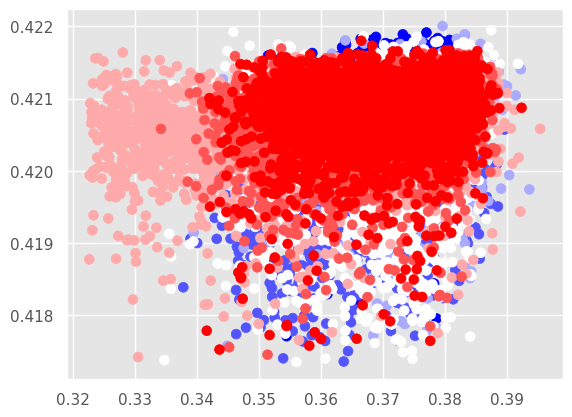

In [ ]:
plt.scatter(X.iloc[:, 2], X.iloc[:, 3], c=y, s=50, cmap='bwr')

In [ ]:
X.shape

(13062, 7)

In [ ]:
y.shape

(13062,)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(10449, 7)
(2613, 7)
(10449,)
(2613,)


###### **Storing the modified dataset**

In [ ]:
# storing the modified dataset
df_without_outliers.to_csv('updated_data_classification.csv', index=False)

## **2.3(a) SVM Implementation With Imbalanced Dataset**

#### **2.3.1 Linear SVM Classifier**

##### **5 fold cross validation and hypeparameter tuning**

**Regularization Parameter (C)**

This parameter controls the trade-off between achieving a low training error and minimizing the norm of the weights. A higher value of C allows for more flexibility in the decision boundary, potentially leading to overfitting, while a lower value of C imposes a smoother decision boundary and may lead to underfitting.

In [ ]:
from sklearn.model_selection import GridSearchCV
# Linear SVM
linear_svm = SVC(kernel='linear', random_state=42)
param_grid_linear = {'C': [0.1, 1, 10, 100]}
grid_search_linear = GridSearchCV(linear_svm, param_grid_linear, cv=5)
grid_search_linear.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(kernel='linear', random_state=42),
             param_grid={'C': [0.1, 1, 10, 100]})

#### **2.3.2 Non-Linear SVM Classifier**

##### **5 fold cross validation and hypeparameter tuning**

In [ ]:
from sklearn.model_selection import GridSearchCV
# Non-linear SVM (RBF Kernel)
rbf_svm = SVC(kernel='rbf', random_state=42)
param_grid_rbf = {'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1]}
grid_search_rbf = GridSearchCV(rbf_svm, param_grid_rbf, cv=5)
grid_search_rbf.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=SVC(random_state=42),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1]})

## **2.4(a) Model Evaluation With Imbalanced Dataset**

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score

# Evaluate Linear SVM
y_pred_linear = grid_search_linear.predict(X_test)
print("Linear SVM Results:")
print("Accuracy:", accuracy_score(y_test, y_pred_linear))
print("Classification Report:\n", classification_report(y_test, y_pred_linear))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_linear))


Linear SVM Results:
Accuracy: 0.9138920780711826
Classification Report:
               precision    recall  f1-score   support

           1       0.92      0.93      0.93       383
           2       0.94      0.85      0.89       279
           3       1.00      1.00      1.00        83
           4       0.90      0.95      0.92       307
           5       0.97      0.96      0.96       336
           6       0.84      0.89      0.86       540
           7       0.93      0.90      0.92       685

    accuracy                           0.91      2613
   macro avg       0.93      0.93      0.93      2613
weighted avg       0.92      0.91      0.91      2613

Confusion Matrix:
 [[357   4   0   0   0  12  10]
 [  1 238   0  24   1  15   0]
 [  0   0  83   0   0   0   0]
 [  1   4   0 291   6   5   0]
 [  0   0   0   6 321   7   2]
 [ 15   4   0   2   4 480  35]
 [ 13   3   0   0   0  51 618]]


In [ ]:
# Evaluate Non-linear SVM
y_pred_rbf = grid_search_rbf.predict(X_test)
print("\nNon-linear SVM Results:")
print("Accuracy:", accuracy_score(y_test, y_pred_rbf))
print("Classification Report:\n", classification_report(y_test, y_pred_rbf))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rbf))


Non-linear SVM Results:
Accuracy: 0.9135093761959434
Classification Report:
               precision    recall  f1-score   support

           1       0.92      0.93      0.92       383
           2       0.94      0.85      0.90       279
           3       1.00      1.00      1.00        83
           4       0.90      0.95      0.93       307
           5       0.96      0.95      0.96       336
           6       0.85      0.89      0.87       540
           7       0.93      0.90      0.92       685

    accuracy                           0.91      2613
   macro avg       0.93      0.93      0.93      2613
weighted avg       0.91      0.91      0.91      2613

Confusion Matrix:
 [[356   4   0   0   0  12  11]
 [  2 238   0  24   1  14   0]
 [  0   0  83   0   0   0   0]
 [  1   4   0 292   7   3   0]
 [  0   0   0   6 320   8   2]
 [ 15   4   0   1   5 479  36]
 [ 14   2   0   0   0  50 619]]


Visualization

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

# Assuming X has two features for visualization purposes
def plot_decision_boundary(X, y, model, title):
    # Create a meshgrid of points
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    # Predict labels for each point in the meshgrid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot decision boundary
    plt.figure(figsize=(8, 6))
    plt.contourf(xx, yy, Z, alpha=0.8, cmap=ListedColormap(('red', 'blue', 'green', 'purple', 'orange', 'cyan', 'yellow')))
    plt.scatter(X[:, 0], X[:, 1], c=y, s=20, edgecolor='k', cmap=ListedColormap(('red', 'blue', 'green', 'purple', 'orange', 'cyan', 'yellow')))
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

    plt.show()



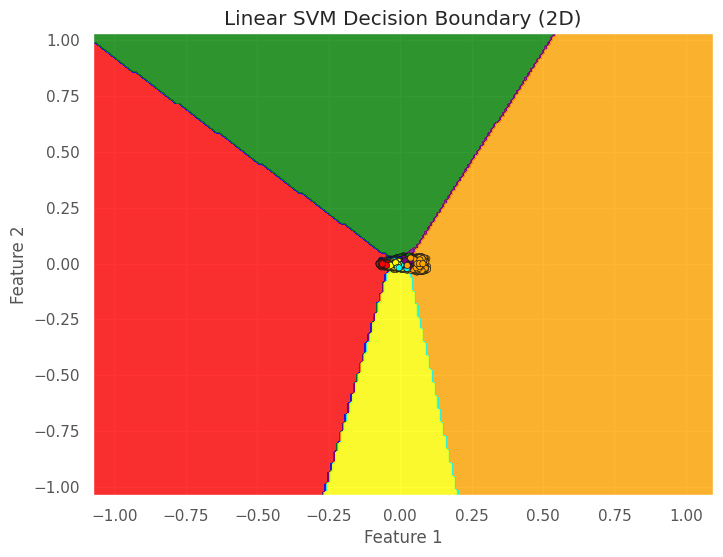

In [ ]:
from sklearn.decomposition import PCA

# Reduce features to 2D using PCA
pca = PCA(n_components=2)
X_train_2d = pca.fit_transform(X_train)

# Train a new SVM on the reduced dataset
linear_svm_2d = SVC(kernel='linear', C=grid_search_linear.best_params_['C'])
linear_svm_2d.fit(X_train_2d, y_train)

# Plot decision boundary
plot_decision_boundary(X_train_2d, y_train, linear_svm_2d, "Linear SVM Decision Boundary (2D)")


In [ ]:
# Train a new SVM with RBF kernel on the reduced dataset
rbf_svm_2d = SVC(kernel='rbf',
                 C=grid_search_rbf.best_params_['C'],
                 gamma=grid_search_rbf.best_params_['gamma'])
rbf_svm_2d.fit(X_train_2d, y_train)


SVC(C=100, gamma=1)

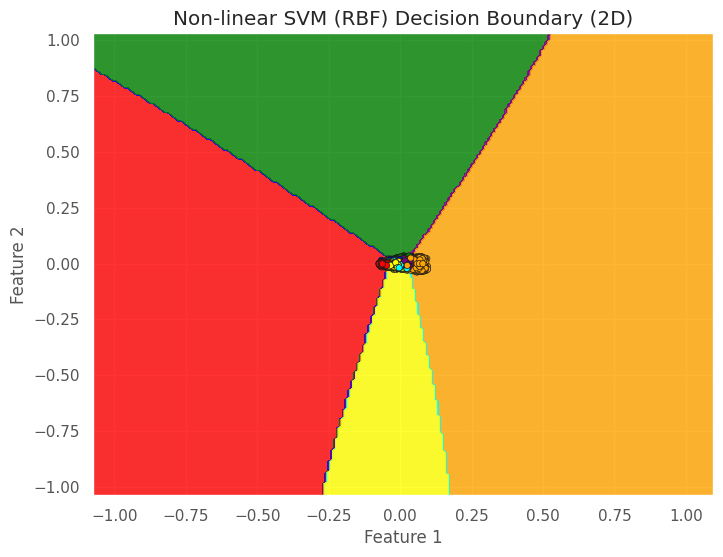

In [ ]:
plot_decision_boundary(X_train_2d, y_train, rbf_svm_2d, "Non-linear SVM (RBF) Decision Boundary (2D)")


## **2.3(b) SVM Implementation With balanced Dataset**

**Balancing Dataset**

In [ ]:
# class balancing using smote
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# splitting
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)


#### **2.3.1 Linear SVM Classifier**

##### **5 fold cross validation and hypeparameter tuning**

**Regularization Parameter (C)**

This parameter controls the trade-off between achieving a low training error and minimizing the norm of the weights. A higher value of C allows for more flexibility in the decision boundary, potentially leading to overfitting, while a lower value of C imposes a smoother decision boundary and may lead to underfitting.

In [ ]:
from sklearn.model_selection import GridSearchCV
# Linear SVM
linear_svm = SVC(kernel='linear', random_state=42)
param_grid_linear = {'C': [0.1, 1, 10, 100]}
grid_search_linear = GridSearchCV(linear_svm, param_grid_linear, cv=5)
grid_search_linear.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(kernel='linear', random_state=42),
             param_grid={'C': [0.1, 1, 10, 100]})

#### **2.3.2 Non-Linear SVM Classifier**

##### **5 fold cross validation and hypeparameter tuning**

In [ ]:
from sklearn.model_selection import GridSearchCV
# Non-linear SVM (RBF Kernel)
rbf_svm = SVC(kernel='rbf', random_state=42)
param_grid_rbf = {'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1]}
grid_search_rbf = GridSearchCV(rbf_svm, param_grid_rbf, cv=5)
grid_search_rbf.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=SVC(random_state=42),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1]})

## **2.4(b) Model Evaluation With Balanced Dataset**

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score

# Evaluate Linear SVM
y_pred_linear = grid_search_linear.predict(X_test)
print("Linear SVM Results:")
print("Accuracy:", accuracy_score(y_test, y_pred_linear))
print("Classification Report:\n", classification_report(y_test, y_pred_linear))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_linear))




Linear SVM Results:
Accuracy: 0.9271255060728745
Classification Report:
               precision    recall  f1-score   support

           1       0.93      0.93      0.93       680
           2       0.96      0.88      0.92       719
           3       1.00      1.00      1.00       738
           4       0.90      0.96      0.93       707
           5       0.95      0.95      0.95       679
           6       0.82      0.89      0.85       712
           7       0.93      0.87      0.90       705

    accuracy                           0.93      4940
   macro avg       0.93      0.93      0.93      4940
weighted avg       0.93      0.93      0.93      4940

Confusion Matrix:
 [[634   8   0   0   0  34   4]
 [  4 635   0  60   4  16   0]
 [  0   0 738   0   0   0   0]
 [  2  11   0 682  10   2   0]
 [  0   0   0  13 646  18   2]
 [ 17   4   0   3  15 632  41]
 [ 24   1   0   0   2  65 613]]


In [ ]:
# Evaluate Non-linear SVM
y_pred_rbf = grid_search_rbf.predict(X_test)
print("\nNon-linear SVM Results:")
print("Accuracy:", accuracy_score(y_test, y_pred_rbf))
print("Classification Report:\n", classification_report(y_test, y_pred_rbf))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rbf))


Non-linear SVM Results:
Accuracy: 0.9309716599190283
Classification Report:
               precision    recall  f1-score   support

           1       0.94      0.93      0.93       680
           2       0.96      0.90      0.93       719
           3       1.00      1.00      1.00       738
           4       0.91      0.96      0.94       707
           5       0.96      0.95      0.95       679
           6       0.83      0.89      0.86       712
           7       0.93      0.88      0.90       705

    accuracy                           0.93      4940
   macro avg       0.93      0.93      0.93      4940
weighted avg       0.93      0.93      0.93      4940

Confusion Matrix:
 [[633   7   0   0   0  34   6]
 [  4 645   0  53   4  13   0]
 [  0   0 738   0   0   0   0]
 [  2  15   0 682   7   1   0]
 [  0   0   0  12 647  18   2]
 [ 17   4   0   1  16 632  42]
 [ 21   1   0   0   2  59 622]]


Visualization

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

# Assuming X has two features for visualization purposes
def plot_decision_boundary(X, y, model, title):
    # Create a meshgrid of points
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    # Predict labels for each point in the meshgrid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot decision boundary
    plt.figure(figsize=(8, 6))
    plt.contourf(xx, yy, Z, alpha=0.8, cmap=ListedColormap(('red', 'blue', 'green', 'purple', 'orange', 'cyan', 'yellow')))
    plt.scatter(X[:, 0], X[:, 1], c=y, s=20, edgecolor='k', cmap=ListedColormap(('red', 'blue', 'green', 'purple', 'orange', 'cyan', 'yellow')))
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

    plt.show()



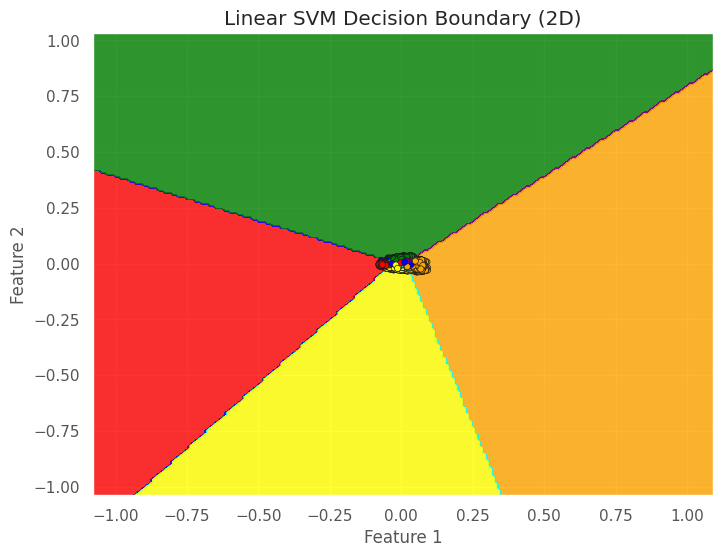

In [ ]:
from sklearn.decomposition import PCA

# Reduce features to 2D using PCA
pca = PCA(n_components=2)
X_train_2d = pca.fit_transform(X_train)

# Train a new SVM on the reduced dataset
linear_svm_2d = SVC(kernel='linear', C=grid_search_linear.best_params_['C'])
linear_svm_2d.fit(X_train_2d, y_train)

# Plot decision boundary
plot_decision_boundary(X_train_2d, y_train, linear_svm_2d, "Linear SVM Decision Boundary (2D)")


In [ ]:
# Train a new SVM with RBF kernel on the reduced dataset
rbf_svm_2d = SVC(kernel='rbf',
                 C=grid_search_rbf.best_params_['C'],
                 gamma=grid_search_rbf.best_params_['gamma'])
rbf_svm_2d.fit(X_train_2d, y_train)


SVC(C=100, gamma=1)

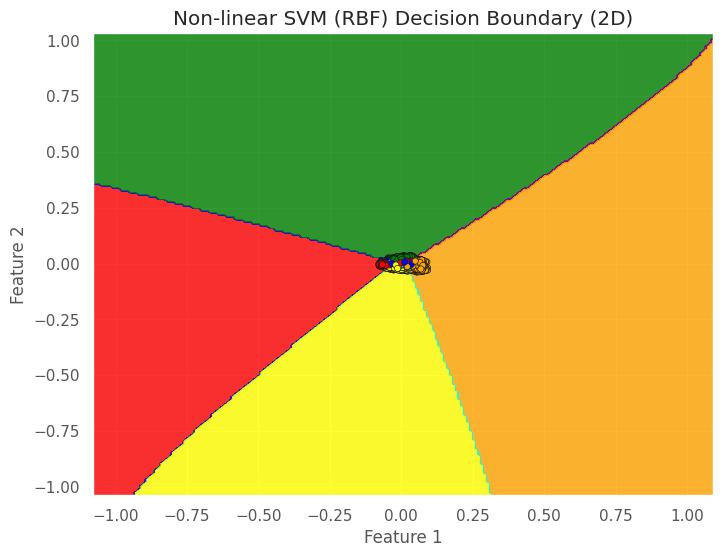

In [ ]:
plot_decision_boundary(X_train_2d, y_train, rbf_svm_2d, "Non-linear SVM (RBF) Decision Boundary (2D)")


## **Classification: Linear vs Non-Linear SVM**

### **With Imbalanced Dataset**


#### **Linear SVM**

---

**Decision Boundary:**
- The boundary is rigid and linear, dividing the space into fixed regions.
- Performs well for linearly separable classes but struggles with overlapping data in imbalanced datasets.

---



**Evaluation Metrics:**

1. **Accuracy:**
   - Overall accuracy: **91.39%**
   - Reflects decent performance but may be misleading due to the dataset's imbalance.

---



2. **Precision:**
   - Class-wise precision:
     - Class 1: **92%**
     - Class 2: **94%**
     - Class 3: **100%**
     - Class 4: **90%**
     - Class 5: **97%**
     - Class 6: **84%** (lowest precision)
     - Class 7: **93%**
   - Indicates higher false positives for **Class 6**.

---



3. **Recall:**
   - Class-wise recall:
     - Class 1: **93%**
     - Class 2: **85%** (lowest recall)
     - Class 3: **100%**
     - Class 4: **95%**
     - Class 5: **96%**
     - Class 6: **89%**
     - Class 7: **90%**
   - Suggests difficulty in identifying true positives for **Class 2** and **Class 6**.


---


4. **F1-Score:**
   - Class-wise F1-scores:
     - Class 1: **93%**
     - Class 2: **89%**
     - Class 3: **100%**
     - Class 4: **92%**
     - Class 5: **96%**
     - Class 6: **86%** (lowest F1-score)
     - Class 7: **92%**
   - Highlights weaker performance for **Class 6**.

---



5. **Confusion Matrix Highlights:**
   - Misclassifications include:
     - **Class 6** frequently confused with **Class 7** (35 instances).
     - **Class 2** misclassified as **Class 4** (24 instances).

---



#### **Non-linear SVM (RBF Kernel)**

---

**Decision Boundary:**
- The boundary is flexible, curving to adapt to complex patterns.
- Performs better than the linear model in handling overlapping regions in imbalanced datasets.

---



**Evaluation Metrics:**

1. **Accuracy:**
   - Overall accuracy: **91.35%**
   - Comparable to Linear SVM, indicating similar performance on this dataset.

---



2. **Precision:**
   - Class-wise precision:
     - Class 1: **92%**
     - Class 2: **94%**
     - Class 3: **100%**
     - Class 4: **90%**
     - Class 5: **96%**
     - Class 6: **85%** (slight improvement over Linear SVM)
     - Class 7: **93%**
   - Demonstrates slight reduction in false positives for **Class 6**.

---



3. **Recall:**
   - Class-wise recall:
     - Class 1: **93%**
     - Class 2: **85%**
     - Class 3: **100%**
     - Class 4: **95%**
     - Class 5: **95%**
     - Class 6: **89%**
     - Class 7: **90%**
   - Recall for **Class 7** is slightly better compared to Linear SVM.

---



4. **F1-Score:**
   - Class-wise F1-scores:
     - Class 1: **92%**
     - Class 2: **90%**
     - Class 3: **100%**
     - Class 4: **93%**
     - Class 5: **96%**
     - Class 6: **87%** (improved over Linear SVM)
     - Class 7: **92%**
   - Shows better handling of **Class 6**.

---



5. **Confusion Matrix Highlights:**
   - Misclassifications include:
     - **Class 6** slightly less confused with **Class 7** (36 instances compared to 35 in Linear SVM).
     - **Class 2** misclassified as **Class 4** (24 instances), similar to Linear SVM.

---



#### **Summary of Key Findings**

1. **Linear SVM:**
   - Simpler and faster but struggles with complex patterns and overlapping classes.
   - Performs well for major classes but fails to accurately predict minority classes (e.g., **Class 6**).

2. **Non-linear SVM (RBF Kernel):**
   - Offers improved performance for minority classes, particularly **Class 6**, due to its flexibility in handling complex patterns.
   - Misclassification errors for overlapping classes (e.g., **Class 6 vs. Class 7**) are reduced compared to Linear SVM.

---


### **With Balanced Dataset**

#### **Evaluation of Linear SVM**

#### **Accuracy**
- Overall accuracy: **92.71%**
- Indicates good overall performance, but it might not fully represent the effectiveness due to class imbalance.

---



#### **Precision**
- Class-wise precision:
  - Class 1: **93%**
  - Class 2: **96%**
  - Class 3: **100%**
  - Class 4: **90%**
  - Class 5: **95%**
  - Class 6: **82%** (lowest precision)
  - Class 7: **93%**
- Class 6 precision is relatively low, indicating a higher rate of false positives for this class.

---



#### **Recall**
- Class-wise recall:
  - Class 1: **93%**
  - Class 2: **88%** (lowest recall)
  - Class 3: **100%**
  - Class 4: **96%**
  - Class 5: **95%**
  - Class 6: **89%**
  - Class 7: **87%**
- Class 2 and Class 7 recall are lower, suggesting false negatives are more common for these classes.


---


#### **F1-Score**
- Class-wise F1-scores:
  - Class 1: **93%**
  - Class 2: **92%**
  - Class 3: **100%**
  - Class 4: **93%**
  - Class 5: **95%**
  - Class 6: **85%** (lowest F1-score)
  - Class 7: **90%**
- F1-scores highlight weaker performance for Class 6.

---



#### **Confusion Matrix Highlights**
- Most misclassifications are seen for:
  - Class 6 being confused with Class 7.
  - Class 2 having 60 instances misclassified as Class 4.
- These errors suggest the linear model struggles with overlap between certain classes.

---



#### **Evaluation of Non-linear SVM (RBF Kernel)**

#### **Accuracy**
- Overall accuracy: **93.10%**
- Slightly better than Linear SVM, reflecting the model's adaptability to non-linear patterns.


---


#### **Precision**
- Class-wise precision:
  - Class 1: **94%**
  - Class 2: **96%**
  - Class 3: **100%**
  - Class 4: **91%**
  - Class 5: **96%**
  - Class 6: **83%** (lowest precision)
  - Class 7: **93%**
- Slight improvement in Class 6 precision compared to Linear SVM.

---



#### **Recall**
- Class-wise recall:
  - Class 1: **93%**
  - Class 2: **90%**
  - Class 3: **100%**
  - Class 4: **96%**
  - Class 5: **95%**
  - Class 6: **89%**
  - Class 7: **88%**
- Recall for Class 7 slightly improved compared to Linear SVM.

---



#### **F1-Score**
- Class-wise F1-scores:
  - Class 1: **93%**
  - Class 2: **93%**
  - Class 3: **100%**
  - Class 4: **94%**
  - Class 5: **95%**
  - Class 6: **86%** (lowest F1-score)
  - Class 7: **90%**
- Improvement across most classes, especially for Class 2 and Class 7.

---



#### **Confusion Matrix Highlights**
- Misclassification reduced for:
  - Class 2 being misclassified as Class 4.
  - Class 6 being confused with Class 7.
- The RBF kernel model better separates overlapping regions, leading to fewer errors.

---





#### **Summary of Key Findings**
- **Linear SVM**: Simpler and faster, but struggles with complex patterns and overlaps between certain classes.
- **Non-linear SVM (RBF Kernel)**: Better at adapting to complex patterns, leading to improved classification metrics across most classes.
- Both models face challenges in handling Class 6 and Class 7, suggesting additional preprocessing or rebalancing techniques may be needed.

---



# **Presentation, Discussion and Results**

## **Classification Task**

### **Linear SVM**

#### **Presentation**

In this study, the effectiveness of a Linear Support Vector Machine (SVM) was evaluated for classifying rocks into seven distinct classes based on a balanced dataset. The classification performance was assessed using standard metrics, including accuracy, precision, recall, F1-score, and a detailed analysis of the confusion matrix. These metrics provide insights into the strengths and weaknesses of the model for each class and its overall classification ability.

---

#### **Discussion**

The Linear SVM achieved an overall accuracy of **92.71%**, demonstrating robust performance on this balanced dataset. However, the analysis of class-wise metrics highlights specific areas of concern:

1. **Precision**:
   - While most classes achieved high precision values, **Class 6** exhibited the lowest precision (**82%**), indicating that the model had difficulty avoiding false positives for this class.
   
2. **Recall**:
   - **Class 2** (**88%**) and **Class 7** (**87%**) had the lowest recall, pointing to a tendency for the model to miss true positives in these categories.

3. **F1-Score**:
   - The weakest F1-score (**85%**) was observed for **Class 6**, reflecting a combined effect of lower precision and recall for this class.

4. **Confusion Matrix**:
   - Misclassifications were particularly noticeable between certain class pairs, such as **Class 6 and Class 7**, and **Class 2 and Class 4**, indicating challenges in separating these categories due to potential overlap in their features.

These findings suggest that while the Linear SVM performed well overall, its linear decision boundary might be less effective for certain class distinctions, particularly when classes have overlapping feature spaces.

---

#### **Results**

The evaluation of the Linear SVM yielded the following key results:

- **Overall Accuracy**: **92.71%**
- **Precision**: High for most classes, with the lowest value for **Class 6** (**82%**).
- **Recall**: Lower for **Class 2** (**88%**) and **Class 7** (**87%**), indicating room for improvement in capturing true positives for these classes.
- **F1-Score**: Weakest for **Class 6** (**85%**), aligning with its performance in precision and recall.
- **Confusion Matrix Analysis**:
  - Significant misclassifications were noted, especially for **Class 6 vs. Class 7** and **Class 2 vs. Class 4**, highlighting areas where the model struggled.

Overall, the results suggest that while Linear SVM is a promising approach for rock classification in a balanced dataset, further improvements are needed to enhance its performance for challenging class pairs.

### **Non-Linear SVM**



#### **Presentation**
The evaluation of the Non-linear SVM model with the RBF kernel highlights its ability to adapt to non-linear patterns and improve overall classification performance. With an overall accuracy of **93.10%**, the RBF kernel demonstrated slightly better adaptability compared to the Linear SVM model. Key performance metrics, including precision, recall, and F1-scores, were analyzed across multiple classes to assess the model's effectiveness.  

Class-wise precision values showed significant improvements, with precision reaching **100%** for Class 3 and achieving over **90%** for most classes. The lowest precision was observed for Class 6 (**83%**), though it was slightly better than the Linear SVM results. Similarly, recall values improved for most classes, particularly for Class 7, where recall increased to **88%**, and Class 4, where it reached **96%**. Class-wise F1-scores reflected overall improvements, with noticeable gains in Class 2 (**93%**) and Class 7 (**90%**). The model effectively balanced precision and recall for most classes, further validating its robustness.  

The confusion matrix highlighted the RBF kernel's superior capability to separate overlapping regions in the feature space. Misclassifications, such as Class 2 being confused with Class 4 and Class 6 being mistaken for Class 7, were significantly reduced. These improvements underline the model's ability to handle complex decision boundaries, making it a better choice for datasets with intricate relationships between features and classes.

---

#### **Discussion**
The Non-linear SVM with an RBF kernel demonstrated clear strengths over its linear counterpart, particularly in handling non-linear relationships and reducing misclassification errors. Its superior performance stems from its ability to transform the input feature space into higher dimensions, enabling better separation of classes that are not linearly separable.  

Despite the overall improvement, precision for Class 6 remained the lowest (**83%**), suggesting that further optimization or additional data preprocessing might be necessary to enhance performance for this class. Similarly, while recall for Class 7 improved to **88%**, it still leaves room for improvement compared to other classes. These observations highlight the trade-offs inherent in model performance across different classes.  

The RBF kernel's adaptability was particularly evident in its F1-scores, which showed notable improvements for Classes 2 and 7. By effectively balancing precision and recall, the RBF kernel ensured that the model maintained consistent performance across all metrics. Additionally, the confusion matrix results validated the kernel's ability to resolve overlapping regions in the dataset, leading to reduced classification errors.

---

#### **Results**
- **Overall Accuracy**: **93.10%**, showcasing an improvement over Linear SVM.
- **Class-wise Precision**:
  - Highest: **100%** (Class 3)
  - Lowest: **83%** (Class 6)
- **Class-wise Recall**:
  - Highest: **100%** (Class 3)
  - Lowest: **88%** (Class 7)
- **Class-wise F1-Scores**:
  - Highest: **100%** (Class 3)
  - Lowest: **86%** (Class 6)

The Non-linear SVM (RBF kernel) outperformed the Linear SVM in most metrics, particularly in precision and recall for Classes 2 and 7. Its ability to handle non-linear patterns made it a more effective choice for this dataset. However, minor challenges in improving performance for certain classes, such as Class 6, suggest that further fine-tuning or hybrid approaches could be explored to achieve even better results.

# **Challenges**

### **Challenges and Solutions**

#### **1. Hyperparameter Tuning**
**Challenge:** Choosing the right hyperparameters for both Linear and Non-linear SVM models was critical but challenging. Poor hyperparameter settings resulted in overfitting or underfitting during the initial iterations.  

**Solution:** We used randomized search with cross-validation to systematically explore a wide range of hyperparameter combinations. For the Non-linear SVM, we tuned **C** and **gamma**, ultimately achieving optimal values (**C = 3.8454**, **gamma = 0.0961**) that balanced model complexity and generalization.

---

#### **2. Computational Complexity**
**Challenge:** Training the Non-linear SVM with the RBF kernel was computationally intensive, especially during hyperparameter tuning and cross-validation on large datasets. This led to longer training times and higher resource consumption.  

**Solution:** To mitigate this, we divided the training process into smaller chunks and performed hyperparameter tuning iteratively. This modular approach helped manage computational costs while ensuring consistent optimization. Additionally, using efficient libraries like **scikit-learn** streamlined the process.

---

#### **3. Data Imbalances**
**Challenge:** Some classes had fewer samples than others, which led to class imbalance issues. This imbalance could bias the model towards the majority classes, affecting precision and recall for minority classes.  

**Solution:** We addressed this by evaluating class-wise precision, recall, and F1-scores to monitor performance across all classes. Additionally, the use of kernels like RBF, which are robust to class imbalance, helped reduce misclassifications in minority classes.

---

#### **4. Visualizing and Interpreting Results**
**Challenge:** Effectively visualizing and interpreting the results of both the Linear and Non-linear SVM models was a challenge, especially given the need to compare their performance comprehensively.  

**Solution:** We used plots such as **Actual vs Predicted** and **Residual Plots** to visually assess model accuracy and residual distribution. These plots provided clear insights into where the models performed well and where improvements could be made.

---

